# Prepare dataset

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:

import os

project_root = '/content/drive/MyDrive/game_AI_project'
vid_root = project_root + '/data/videos'
mask_root = project_root + '/data/masks'
annotations_file_train = project_root + '/data/annotations_train.txt'
annotations_file_val = project_root + '/data/annotations_val.txt'
annotations_file_test = project_root + '/data/annotations_test.txt'
style_root = project_root + '/data/style'
checkpoints_root = project_root + '/checkpoints'
sample_output_root = project_root + '/sample_output'

for dir in [vid_root, mask_root, style_root, checkpoints_root, sample_output_root]:
    try:
        os.mkdir(dir)
    except OSError as error:
        print(error)

[Errno 17] File exists: '/content/drive/MyDrive/game_AI_project/data/videos'
[Errno 17] File exists: '/content/drive/MyDrive/game_AI_project/data/masks'
[Errno 17] File exists: '/content/drive/MyDrive/game_AI_project/data/style'
[Errno 17] File exists: '/content/drive/MyDrive/game_AI_project/checkpoints'
[Errno 17] File exists: '/content/drive/MyDrive/game_AI_project/sample_output'


In [2]:
!rm -rf Video-Dataset-Loading-Pytorch*

In [3]:
!git clone https://github.com/RaivoKoot/Video-Dataset-Loading-Pytorch.git

Cloning into 'Video-Dataset-Loading-Pytorch'...
remote: Enumerating objects: 411, done.
remote: Counting objects: 100% (83/83), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 411 (delta 72), reused 54 (delta 54), pack-reused 328
Receiving objects: 100% (411/411), 6.70 MiB | 5.92 MiB/s, done.
Resolving deltas: 100% (194/194), done.


In [4]:
!cp Video-Dataset-Loading-Pytorch/video_dataset.py ./video_dataset.py

In [ ]:
!git clone https://github.com/davisvideochallenge/davis-2017.git

In [ ]:
!davis-2017/data/get_davis.sh

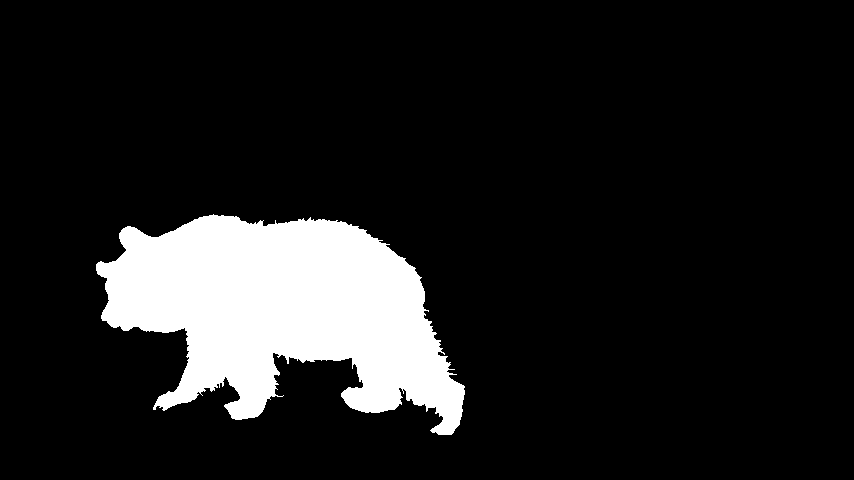

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
cv2_imshow((cv2.cvtColor(cv2.imread('/content/DAVIS/Annotations/480p/bear/00000.png'), cv2.COLOR_BGR2GRAY) > 1).astype(int) * 255)

In [ ]:
#remove dirs where num frames do not match
import os
import os.path as path
vid_path = '/content/DAVIS/JPEGImages/480p'
mask_path = '/content/DAVIS/Annotations/480p'
annotations = []
for f in os.listdir(vid_path):
    if len(os.listdir(path.join(vid_path, f))) != len(os.listdir(path.join(mask_path, f))) or len(os.listdir(path.join(mask_path, f))) == 0:
        print('removing ', f)
        for g in os.listdir(path.join(vid_path, f)):
            os.remove(path.join(vid_path, f, g))
        for g in os.listdir(path.join(mask_path, f)):
            os.remove(path.join(mask_path, f, g))
        os.rmdir(path.join(vid_path, f))
        os.rmdir(path.join(mask_path, f))
    else:
        # print(f)
        min_frame = min(os.listdir(path.join(vid_path, f)))[:-4]
        max_frame = max(os.listdir(path.join(vid_path, f)))[:-4]
        annotations.append((f, min_frame, max_frame, 0))
print(annotations)

removing  giant-slalom
removing  lock
removing  tractor
removing  salsa
removing  chamaleon
removing  deer
removing  monkeys-trees
removing  tennis-vest
removing  rollercoaster
removing  horsejump-stick
removing  seasnake
removing  guitar-violin
removing  car-race
removing  golf
removing  gym
removing  mtb-race
removing  helicopter
removing  carousel
removing  hoverboard
removing  people-sunset
removing  girl-dog
removing  planes-crossing
removing  cats-car
removing  tandem
removing  skate-jump
removing  aerobatics
removing  slackline
removing  orchid
removing  subway
removing  man-bike
[('lucia', '00000', '00069', 0), ('kid-football', '00000', '00067', 0), ('lady-running', '00000', '00064', 0), ('walking', '00000', '00071', 0), ('planes-water', '00000', '00037', 0), ('sheep', '00000', '00067', 0), ('kite-walk', '00000', '00079', 0), ('dogs-jump', '00000', '00065', 0), ('camel', '00000', '00089', 0), ('scooter-gray', '00000', '00074', 0), ('scooter-board', '00000', '00090', 0), ('shoot

In [ ]:
train_count = 60
val_count = 15
test_count = 15

with open('/content/annotations_train.txt', 'w') as f:
    for ann in annotations[:train_count]:
        f.write(f'{ann[0]} {int(ann[1])} {int(ann[2])} {ann[3]}\n')

with open('/content/annotations_val.txt', 'w') as f:
    for ann in annotations[train_count:train_count+val_count]:
        f.write(f'{ann[0]} {int(ann[1])} {int(ann[2])} {ann[3]}\n')

with open('/content/annotations_test.txt', 'w') as f:
    for ann in annotations[train_count+val_count:]:
        f.write(f'{ann[0]} {int(ann[1])} {int(ann[2])} {ann[3]}\n')

In [ ]:
## !rm -rf /content/drive/MyDrive/game_AI_project/data/videos/*
## !rm -rf /content/drive/MyDrive/game_AI_project/data/masks/*
# !cp /content/annotations_train.txt /content/drive/MyDrive/game_AI_project/data/annotations_train.txt
# !cp /content/annotations_val.txt /content/drive/MyDrive/game_AI_project/data/annotations_val.txt
# !cp /content/annotations_test.txt /content/drive/MyDrive/game_AI_project/data/annotations_test.txt
# !cp -r /content/DAVIS/JPEGImages/480p/* /content/drive/MyDrive/game_AI_project/data/videos/
# !cp -r /content/DAVIS/Annotations/480p/* /content/drive/MyDrive/game_AI_project/data/masks/

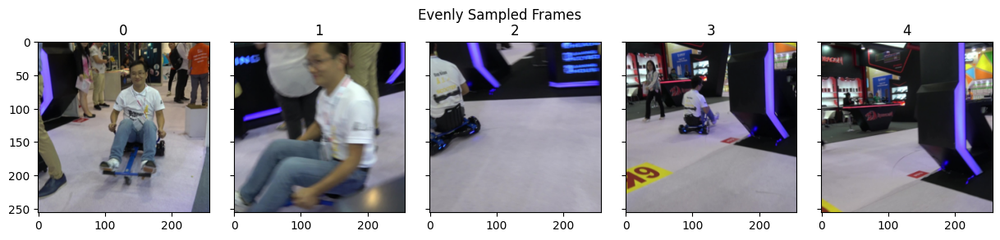

<ipython-input-5-8938b68821ba>:56: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torchvision.transforms.Lambda(lambda x : torch.tensor((x > 0), dtype=torch.float32)),


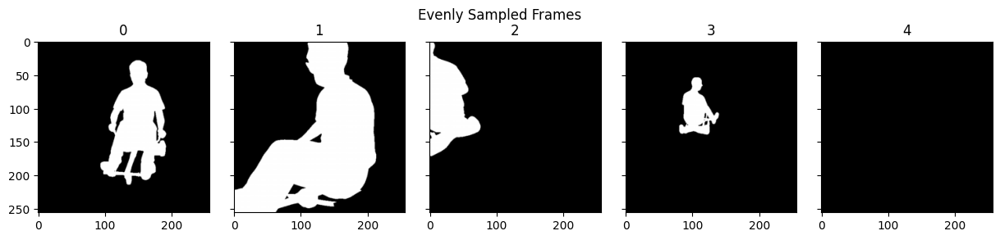

In [5]:
from video_dataset import  VideoFrameDataset, ImglistToTensor
from torchvision import transforms
import torch
import torchvision
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import os

"""
Ignore this function and look at "main" below.
"""
def plot_video(rows, cols, frame_list, plot_width, plot_height, title: str):
    fig = plt.figure(figsize=(plot_width, plot_height))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(rows, cols),  # creates 2x2 grid of axes
                     axes_pad=0.3,  # pad between axes in inch.
                     )

    for index, (ax, im) in enumerate(zip(grid, frame_list)):
        # Iterating over the grid returns the Axes.
        ax.imshow(im)
        ax.set_title(index)
    plt.suptitle(title)
    plt.show()

if __name__ == '__main__':
    """
    This demo uses the dummy dataset inside of the folder "demo_dataset".
    It is structured just like a real dataset would need to be structured.

    TABLE OF CODE CONTENTS:
    1. Minimal demo without image transforms
    2. Minimal demo without sparse temporal sampling for single continuous frame clips, without image transforms
    3. Demo with image transforms
    4. Demo 3 continued with PyTorch dataloader
    5. Demo of using a dataset where samples have multiple separate class labels

    """
    # videos_root = os.path.join('/content', 'DAVIS/JPEGImages/480p')
    # masks_root = os.path.join('/content', 'DAVIS/Annotations/480p')
    # annotation_file = os.path.join('/content', 'annotations.txt')
    videos_root = vid_root
    masks_root = mask_root
    annotation_file = annotations_file_train

    preprocess = transforms.Compose([
        ImglistToTensor(),  # list of PIL images to (FRAMES x CHANNELS x HEIGHT x WIDTH) tensor
        transforms.Resize(256),  # image batch, resize smaller edge to 299
        transforms.CenterCrop(256),  # image batch, center crop to square 299x299
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    preprocess_mask = transforms.Compose([
        ImglistToTensor(),  # list of PIL images to (FRAMES x CHANNELS x HEIGHT x WIDTH) tensor
        torchvision.transforms.Grayscale(num_output_channels=3),
        torchvision.transforms.Lambda(lambda x : torch.tensor((x > 0), dtype=torch.float32)),
        transforms.Resize(256),  # image batch, resize smaller edge to 299
        transforms.CenterCrop(256),  # image batch, center crop to square 299x299
        # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    def denormalize(video_tensor):
        """
        Undoes mean/standard deviation normalization, zero to one scaling,
        and channel rearrangement for a batch of images.
        args:
            video_tensor: a (FRAMES x CHANNELS x HEIGHT x WIDTH) tensor
        """
        inverse_normalize = transforms.Normalize(
            mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
            std=[1 / 0.229, 1 / 0.224, 1 / 0.225]
        )
        return (inverse_normalize(video_tensor) * 255.).type(torch.uint8).permute(0, 2, 3, 1).numpy()

    """ DEMO 1 WITHOUT IMAGE TRANSFORMS """
    dataset = VideoFrameDataset(
        root_path=videos_root,
        annotationfile_path=annotation_file,
        num_segments=10,
        frames_per_segment=1,
        imagefile_template='{:05d}.jpg',
        transform=preprocess,
        test_mode=True
    )

    sample = dataset[10]
    frames = sample[0]  # list of PIL images
    label = sample[1]   # integer label

    plot_video(rows=1, cols=5, frame_list=denormalize(frames), plot_width=15., plot_height=3.,
               title='Evenly Sampled Frames')

    mask_dataset = VideoFrameDataset(
        root_path=masks_root,
        annotationfile_path=annotation_file,
        num_segments=10,
        frames_per_segment=1,
        imagefile_template='{:05d}.png',
        transform=preprocess_mask,
        test_mode=True
    )

    mask_sample = mask_dataset[10]
    mask_frames = mask_sample[0]  # list of PIL images
    mask_label = mask_sample[1]   # integer label

    plot_video(rows=1, cols=5, frame_list=(mask_frames * 255).type(torch.uint8).permute(0,2,3,1).numpy(), plot_width=15., plot_height=3.,
               title='Evenly Sampled Frames')


In [6]:
print(len(dataset))
print(len(dataset[0]))
print(type(dataset[0][0]))
print(dataset[0][0].shape, dataset[0][1])

60
2
<class 'torch.Tensor'>
torch.Size([10, 3, 256, 256]) 0


In [7]:
import os
from PIL import Image
import torch.nn.functional as F

import numpy as np
import torch
from torchvision import transforms
from torchvision.io import read_video
from torch.utils.data import Dataset
import random

def resize(image, size):
    image = F.interpolate(image.unsqueeze(0), size=size, mode="nearest").squeeze(0)
    return image

def denormalize(video_tensor):
    """
    Undoes mean/standard deviation normalization, zero to one scaling,
    and channel rearrangement for a batch of images.
    args:
        video_tensor: a (FRAMES x CHANNELS x HEIGHT x WIDTH) tensor
    """
    inverse_normalize = transforms.Normalize(
        mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
        std=[1 / 0.229, 1 / 0.224, 1 / 0.225]
    )
    return (inverse_normalize(video_tensor) * 255.).type(torch.uint8).permute(0, 2, 3, 1).numpy()


class MVSTDataset(Dataset):
    def __init__(self,cont_vids_path, cont_mask_vids_path, annotations_path, style_imgs_path, num_classes, img_size=256):

        self.preprocess = transforms.Compose([
            ImglistToTensor(),  # list of PIL images to (FRAMES x CHANNELS x HEIGHT x WIDTH) tensor
            transforms.Resize(256),  # image batch, resize smaller edge to 299
            transforms.CenterCrop(256),  # image batch, center crop to square 299x299
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])

        self.preprocess_mask = transforms.Compose([
            ImglistToTensor(),  # list of PIL images to (FRAMES x CHANNELS x HEIGHT x WIDTH) tensor
            torchvision.transforms.Grayscale(num_output_channels=3),
            torchvision.transforms.Lambda(lambda x : torch.tensor((x > 0), dtype=torch.float32)),
            transforms.Resize(256),  # image batch, resize smaller edge to 299
            transforms.CenterCrop(256),  # image batch, center crop to square 299x299
            # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])

        self.cont_vids_path = cont_vids_path
        self.cont_mask_vids_path = cont_mask_vids_path
        self.annotation_file = annotation_file
        self.style_imgs_path = style_imgs_path
        self.style_img_files = self.list_files(style_imgs_path)
        self.img_size = img_size
        assert(num_classes == 2)
        self.num_classes = num_classes
        self.transform = transforms.Compose([
            transforms.Resize((self.img_size,self.img_size), Image.BICUBIC),
            transforms.ToTensor()
        ])
        self.FRAME_COUNT = 100
        self.dataset = VideoFrameDataset(
            root_path=cont_vids_path,
            annotationfile_path=annotation_file,
            num_segments=10,
            frames_per_segment=1,
            imagefile_template='{:05d}.jpg',
            transform=preprocess,
            test_mode=True
        )

        self.mask_dataset = VideoFrameDataset(
            root_path=cont_mask_vids_path,
            annotationfile_path=annotation_file,
            num_segments=10,
            frames_per_segment=1,
            imagefile_template='{:05d}.png',
            transform=preprocess_mask,
            test_mode=True
        )

        self.style_dataset = torchvision.datasets.ImageFolder(self.style_imgs_path, transforms.Compose([
            transforms.Resize(256),  # image batch, resize smaller edge to 299
            transforms.CenterCrop(256),  # image batch, center crop to square 299x299
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ]))

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self,idx):
        # two random style images
        style_idx1 = np.random.randint(len(self.style_dataset))
        style_idx2 = np.random.randint(len(self.style_dataset))
        while style_idx2 == style_idx1:
            style_idx2 = np.random.randint(len(self.style_dataset))

        cont_idx = idx

        cont_vid_item = self.dataset.__getitem__(cont_idx)[0]
        cont_mask_vid_item = self.mask_dataset.__getitem__(cont_idx)[0]
        style_img_item1 = self.style_dataset.__getitem__(style_idx1)[0]
        style_img_item2 = self.style_dataset.__getitem__(style_idx2)[0]

        cont_mask_vid_item = torch.unsqueeze(cont_mask_vid_item, 0) # 1xFx3x256x256

        style_img_item1 = torch.unsqueeze(style_img_item1, 0) # 1x3x256x256
        style_img_item2 = torch.unsqueeze(style_img_item2, 0) # 1x3x256x256
        # print(f'loading : {cont_mask_vid_item.min()} {cont_mask_vid_item.max()} {(1-cont_mask_vid_item).min()} {(1-cont_mask_vid_item).max()}')
        return cont_vid_item, torch.cat([cont_mask_vid_item, 1-cont_mask_vid_item], dim=0), torch.cat([style_img_item1, style_img_item2], dim=0)


    def list_files(self, in_path):
        files = []
        for (dirpath, dirnames, filenames) in os.walk(in_path):
            files.extend(filenames)
            break
        files = sorted([os.path.join(in_path, x) for x in files])
        return files


In [8]:
!rm -rf /content/style/.ipynb_checkpoint*

Using device: cpu


<ipython-input-5-8938b68821ba>:56: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torchvision.transforms.Lambda(lambda x : torch.tensor((x > 0), dtype=torch.float32)),


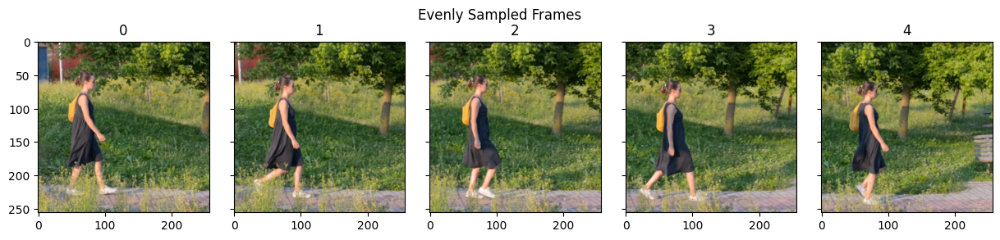

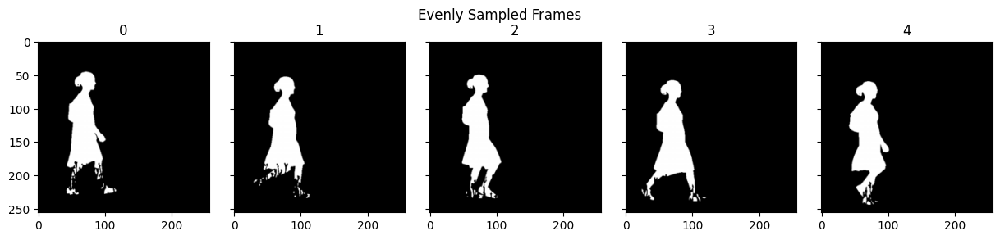

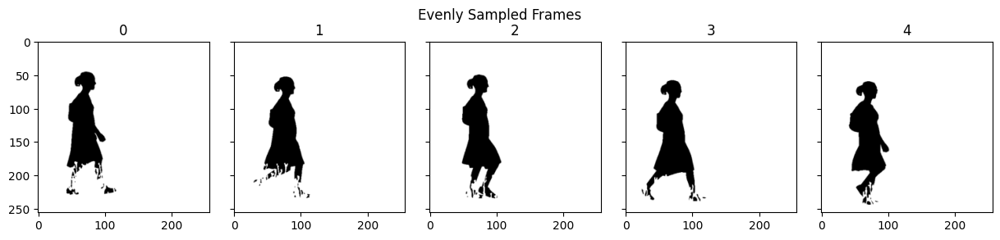

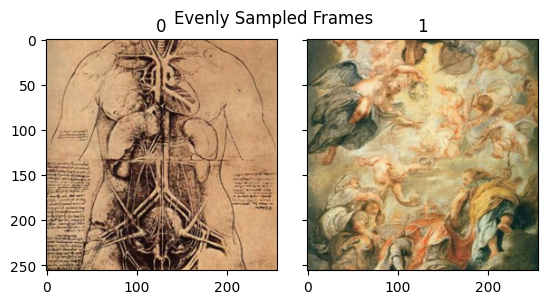

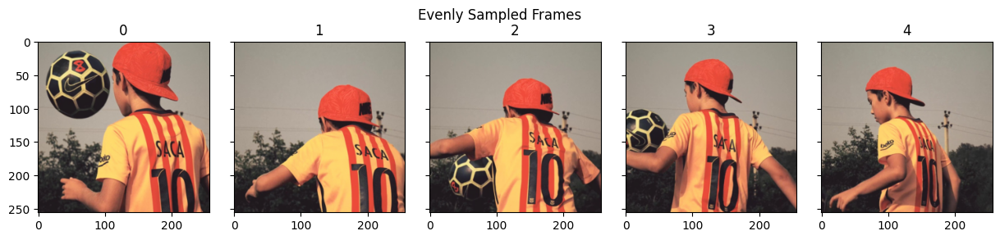

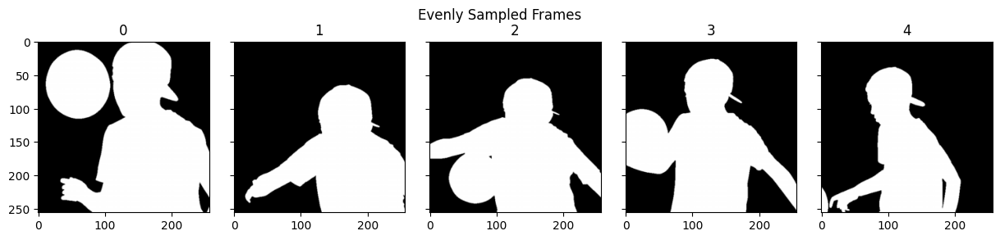

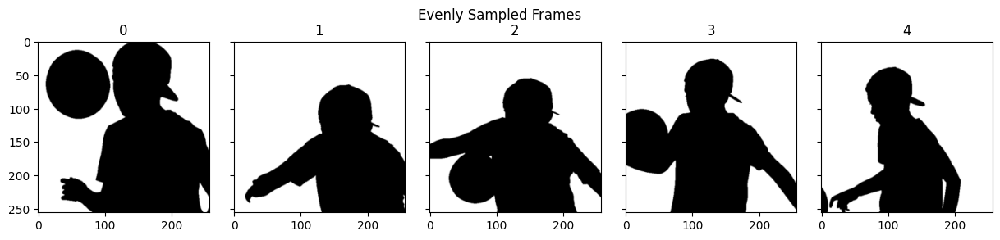

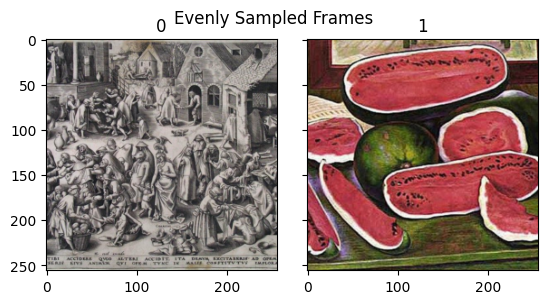

In [9]:
from torch.utils.data import DataLoader
from torch.optim import SGD, Adam
from torchvision.models.optical_flow import raft_small
from torchvision.models.optical_flow import Raft_Small_Weights
import sys

args = {}
args['cont_vids_path'] = vid_root #/vids
args['cont_mask_vids_path'] = mask_root #/mask_vids
args['annotations_path'] = annotations_file_train #/mask_vids
args['style_imgs_path'] = style_root #/style_images
args['num_classes'] = 2
args['batch_size'] = 1
args['checkpoint_path'] = checkpoints_root
args['output_path'] = sample_output_root
args['log_interval'] = 5
args['ckpt_interval'] = 10

cont_vids_path = args['cont_vids_path'] #/vids
cont_mask_vids_path = args['cont_mask_vids_path'] #/mask_vids
annotations_path = args['annotations_path'] #/annotations_path
style_imgs_path = args['style_imgs_path'] #/style_images
num_classes = args['num_classes'] #/num_classes
batch_size = args['batch_size']
checkpoint_path = args['checkpoint_path']
output_path = args['output_path']
log_interval = args['log_interval']
ckpt_interval = args['ckpt_interval']

# set dataset
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
train_dataset = MVSTDataset(cont_vids_path, cont_mask_vids_path, annotations_path, style_imgs_path, num_classes, img_size=256)
train_loader = DataLoader(train_dataset, batch_size=batch_size)

count = 0
for i ,(cont_imgs, mask_img_lists, style_img_lists) in enumerate(train_loader):
    #cont_img is B x num_frames x 3 x 256 x 256
    plot_video(rows=1, cols=5, frame_list=denormalize(cont_imgs[0]), plot_width=15., plot_height=3.,
               title='Evenly Sampled Frames')
    plot_video(rows=1, cols=5, frame_list=(mask_img_lists[0][0] * 255).type(torch.uint8).permute(0,2,3,1).numpy(), plot_width=15., plot_height=3.,
               title='Evenly Sampled Frames')
    plot_video(rows=1, cols=5, frame_list=(mask_img_lists[0][1] * 255).type(torch.uint8).permute(0,2,3,1).numpy(), plot_width=15., plot_height=3.,
               title='Evenly Sampled Frames')
    plot_video(rows=1, cols=2, frame_list=denormalize(style_img_lists[0]), plot_width=15., plot_height=3.,
               title='Evenly Sampled Frames')
    count += 1
    if count >1:
        break

# Masked Video Style Transfer

In [10]:
import os
import numpy as np
import matplotlib.pyplot as plt
import time

# Defining the global variables.


In [11]:
import torch.nn as nn
import torch.nn.functional as F
import torch
import torchvision
from torchvision import models
from torchsummary import summary
from torchvision.models.feature_extraction import create_feature_extractor


def resize(image, size):
    image = F.interpolate(image.unsqueeze(0), size=size, mode="nearest").squeeze(0)
    return image


def calc_mean_std(feat, eps=1e-5):
    # eps is a small value added to the variance to avoid divide-by-zero.
    size = feat.size()
    assert (len(size) == 4)
    N, C = size[:2]
    feat_var = feat.view(N, C, -1).var(dim=2) + eps
    feat_std = feat_var.sqrt().view(N, C, 1, 1)
    feat_mean = feat.view(N, C, -1).mean(dim=2).view(N, C, 1, 1)
    return feat_mean, feat_std


def st_ada_in(style_features, content_cur_masked_features, content_prev_masked_features, alpha = 0.1):
    # print('#', style_features.shape, content_cur_masked_features.shape, content_prev_masked_features.shape) #BxCxSxS

    x_cur_mean, x_cur_std = calc_mean_std(content_cur_masked_features)
    x_prev_mean, x_prev_std = calc_mean_std(content_prev_masked_features)

    # print('#', type(alpha), type(x_cur_mean), type(x_prev_mean))
    combined_mean = (1-alpha) * x_cur_mean + alpha * x_prev_mean
    combined_std = (1-alpha) * x_cur_std + alpha * x_prev_std

    style_mean, style_std = calc_mean_std(style_features)

    result = style_std * (content_cur_masked_features - combined_mean) / combined_std + style_mean
    # print('#', x_cur_mean.shape, result.shape)
    return result


def get_VGG_feature_extractor():
    # vgg_layer_names = ["block1_conv1", "block2_conv1", "block3_conv1", "block4_conv1"]
    # vgg_layer_names = ["ReLU-2", "ReLU-7", "ReLU-12", "ReLU-21"]
    vgg_fixed = torchvision.models.vgg19(weights='IMAGENET1K_V1')
    for param in vgg_fixed.parameters():
        param.requires_grad = False

    # train_nodes, eval_nodes = get_graph_node_names(vgg_fixed)
    # print(train_nodes, eval_nodes)

    # To specify the nodes you want to extract, you could select the final node
    # that appears in each of the main layers:
    return_nodes = {
        # node_name: user-specified key for output dict
        'features.2': 'layer1',
        'features.7': 'layer2',
        'features.12': 'layer3',
        'features.21': 'layer4',
    }

    return create_feature_extractor(vgg_fixed, return_nodes=return_nodes)


class SpatioTemporalTransferModel(nn.Module):
    def __init__(self, vgg_feature_extractor):
        super(SpatioTemporalTransferModel, self).__init__()
        self.vgg_feature_extractor = vgg_feature_extractor

        #define splatting blocks' layers
        self.sb_11 = ConvBlock(in_channels=64, out_channels=8, kernel_size=3,  padding="same", stride=2)
        self.sb_12 = ConvBlock(in_channels=8, out_channels=8, kernel_size=3,  padding="same", stride=1)
        self.sb_13 = ConvBlock(in_channels=8, out_channels=8, kernel_size=3,  padding="same", stride=1)
        self.sb_1_short = ConvBlock(in_channels=128, out_channels=8, kernel_size=3,  padding="same", stride=1)

        self.sb_21 = ConvBlock(in_channels=8, out_channels=16, kernel_size=3,  padding="same", stride=2)
        self.sb_22 = ConvBlock(in_channels=16, out_channels=16, kernel_size=3,  padding="same", stride=1)
        self.sb_23 = ConvBlock(in_channels=16, out_channels=16, kernel_size=3,  padding="same", stride=1)
        self.sb_2_short = ConvBlock(in_channels=256, out_channels=16, kernel_size=3,  padding="same", stride=1)

        self.sb_31 = ConvBlock(in_channels=16, out_channels=32, kernel_size=3,  padding="same", stride=2)
        self.sb_32 = ConvBlock(in_channels=32, out_channels=32, kernel_size=3,  padding="same", stride=1)
        self.sb_33 = ConvBlock(in_channels=32, out_channels=32, kernel_size=3,  padding="same", stride=1)
        self.sb_3_short = ConvBlock(in_channels=512, out_channels=32, kernel_size=3,  padding="same", stride=1)

        self.l_1 = ConvBlock(in_channels=32, out_channels=64, kernel_size=3,  padding="same", stride=2)
        self.l_2 = ConvBlock(in_channels=64, out_channels=64, kernel_size=3,  padding="same", stride=1)

        self.gp_1 = ConvBlock(in_channels=64, out_channels=64, kernel_size=3,  padding="same", stride=1)

        self.gp_2 = ConvBlock(in_channels=64, out_channels=96, kernel_size=1,  padding="same", stride=1, activation=None) #TODO : activation none?
        return

    def forward(self, style, content, mask, mask_prev, cpe_1, cpe_2, cpe_3, cpe_4, adap_1, adap_2, adap_3):
        # Encode the style and content image.

        style_encoded_dict = self.vgg_feature_extractor(style)
        style_encoded = [style_encoded_dict[f'layer{i}'] for i in range(1,5)]

        content_encoded_dict = self.vgg_feature_extractor(content * mask)
        content_encoded = [content_encoded_dict[f'layer{i}'] for i in range(1,5)]

        # Compute the AdaIN target feature maps.
        st_ada_in_outputs = []
        # skip block1_conv1
        skipCount = 1
        count = 0
        content_prev_encoded = [cpe_1, cpe_2, cpe_3, cpe_4]
        for encoded_features in zip(style_encoded, content_encoded, content_prev_encoded):
            # print('! ', count)
            if count < skipCount:
                count += 1
                continue
            # TODO : consider mask shape
            st_ada_in_output = st_ada_in(encoded_features[0], encoded_features[1], encoded_features[2], alpha = 0.1)
            st_ada_in_outputs.append(st_ada_in_output)

        temp_content = self.sb_11(content_encoded[0]) #input is c_in
        temp_style = self.sb_11(style_encoded[0]) #input is s_in
        temp_content_stylized = st_ada_in(temp_style, temp_content, adap_1, alpha = 0.1)
        adap_1 = temp_content.clone().detach()
        temp_content_stylized = temp_content_stylized + self.sb_1_short(st_ada_in_outputs[0])
        temp_content_stylized = self.sb_12(temp_content_stylized)
        temp_content_stylized = self.sb_13(temp_content_stylized) #c_out
        # print('here', temp_style.shape)
        temp_style = self.sb_13(temp_style) #s_out

        temp_content = self.sb_21(temp_content_stylized) #input is c_in
        temp_style = self.sb_21(temp_style) #input is s_in
        temp_content_stylized = st_ada_in(temp_style, temp_content, adap_2, alpha = 0.1)
        adap_2 = temp_content.clone().detach()
        temp_content_stylized = temp_content_stylized + self.sb_2_short(st_ada_in_outputs[1])
        temp_content_stylized = self.sb_22(temp_content_stylized)
        temp_content_stylized = self.sb_23(temp_content_stylized) #c_out
        temp_style = self.sb_23(temp_style) #s_out

        temp_content = self.sb_31(temp_content_stylized) #input is c_in
        temp_style = self.sb_31(temp_style) #input is s_in
        temp_content_stylized = st_ada_in(temp_style, temp_content, adap_3, alpha = 0.1)
        adap_3 = temp_content.clone().detach()
        temp_content_stylized = temp_content_stylized + self.sb_3_short(st_ada_in_outputs[2])
        temp_content_stylized = self.sb_32(temp_content_stylized)
        temp_content_stylized = self.sb_33(temp_content_stylized) #c_out
        temp_style = self.sb_33(temp_style) #s_out

        temp_content_stylized = self.l_1(temp_content_stylized)
        temp_content_stylized = self.l_2(temp_content_stylized) #stylized_features

        #grid prediction
        bilateral_grid = self.gp_1(temp_content_stylized)
        bilateral_grid = self.gp_2(bilateral_grid)

        content_prev_encoded = content_encoded.copy()

        return bilateral_grid, content_prev_encoded[0], content_prev_encoded[1], content_prev_encoded[2], content_prev_encoded[3], adap_1, adap_2, adap_3


class SoftGridMask(nn.Module):
    def __init__(self):
        super(SoftGridMask, self).__init__()

    def create_soft_grid_mask(self, z, M_px, w, h, W, H, D):
        #TODO check algo
        B = M_px.shape[0] #batch size
        M_grid = torch.tensor(np.zeros((B, D, W, H)), dtype=torch.float32).to(device)
        # print((z * M_px * D).shape)
        z_D = torch.floor((z * M_px) * D) # B x 1 x h x w
        s_w, s_h = w//W, h//H

        for x in range(W):
            for y in range(H):
                patch = z_D[:, 0, x * s_w : (x + 1) * s_w, y*s_h:(y+1)*s_h] # B x s_w x s_h
                temp = torch.sum(torch.where(patch > 0, patch, torch.zeros_like(patch)), dim = (1, 2)) # B scalars
                # print("patch.shape ",z_D.shape, patch.shape, temp.shape, z_D.min(), z_D.max(), torch.any(patch > 0), temp)
                M_grid[:,:,x,y] = temp.unsqueeze(1).repeat(1,D) #B x D
                for d in range(D):
                    d_in_patch = torch.any(patch == d, dim = (1,2))
                    for b in range(B):
                        if d_in_patch[b]:
                            temp = torch.sum(torch.where(patch[b,:,:] == d, patch[b,:,:], torch.zeros_like(patch[b,:,:]))) #scalar
                            # print('____', temp)
                            M_grid[b,d,x,y] = temp
        M_grid = M_grid / (s_w * s_h)
        return M_grid

    def forward(self, z, M_px, w, h, W, H, D):
        #use only one channel of the mask
        B = M_px.shape[0]
        sgm = self.create_soft_grid_mask(z, M_px[:, 0:1, :, :], w, h, W, H, D)
        # print('SGM : min, max', z.min(), z.max(), M_px.min(), M_px.max(), sgm.min(), sgm.max())
        # plt.matshow(z[0,0].cpu().detach().numpy())
        # plt.matshow( M_px[0, 0, :, :].cpu().detach().numpy())
        # plt.matshow(torch.sum(sgm, dim = 1)[0].cpu().detach().numpy())
        # plt.show()
        return sgm


class GridBlender(nn.Module):
    def __init__(self):
        super(GridBlender, self).__init__()

    def forward(self, grids, soft_grid_masks):
        #TODO : use grid blending function
        # print(len(grids), grids[0].shape, soft_grid_mask.shape)
        a = torch.multiply(soft_grid_masks[0], grids[0])
        b = torch.multiply(soft_grid_masks[1], grids[1])
        out = torch.add(a,b) #B x D x H x W
        # print('GB : ', a.shape, b.shape, out.shape, a.min(), a.max(), b.min(), b.max(), out.min(), out.max())
        # plt.matshow(torch.sum(out, dim = 1)[0].cpu().detach().numpy())
        # plt.show()
        return out

#########################################################################################################
class MaskedVideoStyleTransfer(nn.Module):
    def __init__(self, slice, apply):
        super(MaskedVideoStyleTransfer, self).__init__()
        self.vgg_feature_extractor = get_VGG_feature_extractor()
        self.spatio_temporal_model = SpatioTemporalTransferModel(self.vgg_feature_extractor)
        self.grid_blender = GridBlender()
        self.guide = GuideNN()
        self.slice = slice
        self.apply_coeffs = apply
        self.soft_grid_mask = SoftGridMask()



    def forward(self, content, mask_cur_list, style_list, mask_prev_list, cpe_1_all, cpe_2_all, cpe_3_all, cpe_4_all, adap_1_all, adap_2_all, adap_3_all):
        # model : torch.Size([2, 3, 256, 256]) torch.Size([2, 2, 3, 256, 256]) torch.Size([2, 2, 3, 256, 256]) torch.Size([2, 3, 256, 256]) torch.Size([2, 2, 3, 256, 256]) torch.Size([2, 2, 64, 224, 224]) torch.Size([2, 2, 128, 112, 112]) torch.Size([2, 2, 256, 56, 56]) torch.Size([2, 2, 512, 28, 28]) torch.Size([2, 2, 8, 112, 112]) torch.Size([2, 2, 16, 56, 56]) torch.Size([2, 2, 32, 28, 28])
        # print('model :', content.shape, mask_cur_list.shape, style_list.shape, mask_prev_list.shape, cpe_1_all.shape, cpe_2_all.shape, cpe_3_all.shape, cpe_4_all.shape, adap_1_all.shape, adap_2_all.shape, adap_3_all.shape)

        bilateral_grid_list = []
        for classId in range(mask_cur_list.shape[1]):
            bilateral_grid, cpe_1_, cpe_2_, cpe_3_, cpe_4_, adap_1, adap_2, adap_3 = self.spatio_temporal_model(style_list[:,classId,:,:,:], content, mask_cur_list[:,classId,:,:,:], mask_prev_list[:,classId,:,:,:], cpe_1_all[:,classId,:,:,:], cpe_2_all[:,classId,:,:,:], cpe_3_all[:,classId,:,:,:], cpe_4_all[:,classId,:,:,:], adap_1_all[:, classId, :, :, :], adap_2_all[:, classId, :, :, :], adap_3_all[:, classId, :, :, :])

            cpe_1_all[:,classId, :, :, :], cpe_2_all[:,classId, :, :, :], cpe_3_all[:,classId, :, :, :], cpe_4_all[:,classId, :, :, :], adap_1_all[:, classId, :, :, :], adap_2_all[:, classId, :, :, :], adap_3_all[:, classId, :, :, :] = cpe_1_, cpe_2_, cpe_3_, cpe_4_, adap_1, adap_2, adap_3

            bilateral_grid_list.append(bilateral_grid)

        guide = self.guide(content)
        # TODO : replace after fixing mask loss
        # guide = torchvision.transforms.Grayscale(num_output_channels=1)(content)
        soft_grid_mask_foreground = self.soft_grid_mask(guide, mask_cur_list[:,0,:,:,:], 256, 256, 16, 16, 96) #assuming 2 classes in the order foreground, background, first dimension is batch
        soft_grid_mask_background = self.soft_grid_mask(guide, mask_cur_list[:,1,:,:,:], 256, 256, 16, 16, 96) #assuming 2 classes in the order foreground, background, first dimension is batch
        #TODO: handle multiple masks, one for each class
        blended_grid = self.grid_blender(bilateral_grid_list, [soft_grid_mask_foreground, soft_grid_mask_background])
        blended_grid_ = blended_grid.reshape(blended_grid.shape[0],12,-1,blended_grid.shape[-2],blended_grid.shape[-1])
        slice_coeffs = self.slice(blended_grid_, guide)
        output = self.apply_coeffs(slice_coeffs, content)

        return output, blended_grid, soft_grid_mask_foreground, soft_grid_mask_background, guide, cpe_1_all, cpe_2_all, cpe_3_all, cpe_4_all, adap_1_all, adap_2_all, adap_3_all
########################################################################################################

class LaplacianRegularizer3D(nn.Module):
    def __init__(self):
        super(LaplacianRegularizer3D, self).__init__()
        self.mse_loss = torch.nn.MSELoss(reduction='sum')

    def forward(self, f):
        loss = 0.
        # f: [B, 12, 8, H, W]
        f = f.reshape(f.shape[0],12,8,f.shape[2],f.shape[-1])
        B, C, D, H, W = f.shape
        for k in range(D):
            for i in range(H):
                for j in range(W):
                    front = max(k - 1, 0)
                    back = min(k + 1, D - 1)
                    up = max(i - 1, 0)
                    down = min(i + 1, H - 1)
                    left = max(j - 1, 0)
                    right = min(j + 1, W - 1)
                    term = f[:, :, k, i, j].view(B, C, 1, 1, 1).expand(B, C, back - front + 1, down - up + 1, right - left + 1)
                    loss += self.mse_loss(term, f[:, :, front:back + 1, up:down + 1, left:right + 1])
        return loss


class Slice(nn.Module):
    def __init__(self):
        super(Slice, self).__init__()

    def forward(self, bilateral_grid, guidemap):
        device = bilateral_grid.get_device()

        N, _, H, W = guidemap.shape
        hg, wg = torch.meshgrid([torch.arange(0, H), torch.arange(0, W)]) # [0,255] HxW
        if device >= 0:
            hg = hg.to(device)
            wg = wg.to(device)
        hg = hg.float().repeat(N, 1, 1).unsqueeze(3) / (H-1) * 2 - 1 # norm to [-1,1] NxHxWx1
        wg = wg.float().repeat(N, 1, 1).unsqueeze(3) / (W-1) * 2 - 1 # norm to [-1,1] NxHxWx1
        guidemap = (guidemap * 2 - 1.0).permute(0,2,3,1).contiguous()
        guidemap_guide = torch.cat([wg, hg, guidemap], dim=3).unsqueeze(1) # Nx1xHxWx3
        coeff = F.grid_sample(bilateral_grid, guidemap_guide, align_corners=True)
        # print('Slice__: ', wg.shape, wg.min(), wg.max(), hg.shape, hg.min(), hg.max(), guidemap.shape, guidemap.min(), guidemap.max())
        # print('Slice: ', bilateral_grid.shape, bilateral_grid.min(), bilateral_grid.max(), guidemap_guide.shape, guidemap_guide.min(), guidemap_guide.max(), coeff.shape, coeff.min(), coeff.max())
        return coeff.squeeze(2)


class ApplyCoeffs(nn.Module):
    def __init__(self):
        super(ApplyCoeffs, self).__init__()
        self.degree = 3

    def forward(self, coeff, full_res_input):

        '''
            Affine:
            r = a11*r + a12*g + a13*b + a14
            g = a21*r + a22*g + a23*b + a24
            ...
        '''

        R = torch.sum(full_res_input * coeff[:, 0:3, :, :], dim=1, keepdim=True) + coeff[:, 3:4, :, :]
        G = torch.sum(full_res_input * coeff[:, 4:7, :, :], dim=1, keepdim=True) + coeff[:, 7:8, :, :]
        B = torch.sum(full_res_input * coeff[:, 8:11, :, :], dim=1, keepdim=True) + coeff[:, 11:12, :, :]

        out = torch.cat([R, G, B], dim=1)
        # print('Apply : ', coeff.shape, coeff.min(), coeff.max(), full_res_input.shape, full_res_input.min(), full_res_input.max(), out.shape, out.min(), out.max())
        return out


class GuideNN(nn.Module):
    def __init__(self, params=None):
        super(GuideNN, self).__init__()
        self.params = params
        self.conv1 = ConvBlock(3, 16, kernel_size=1, padding=0, batch_norm=False)
        self.conv2 = ConvBlock(16, 1, kernel_size=1, padding=0, activation=nn.Sigmoid)

    def forward(self, x):
        return self.conv2(self.conv1(x))


class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, padding="same", stride=1, use_bias=True, activation=nn.ReLU,
                 batch_norm=False):
        super(ConvBlock, self).__init__()
        reflection_padding = kernel_size // 2 # same dimension after padding
        self.reflection_pad = nn.ReflectionPad2d(reflection_padding)
        self.conv = nn.Conv2d(int(in_channels), int(out_channels), kernel_size, stride=stride, bias=use_bias)
        self.activation = activation() if activation else None
        self.bn = nn.BatchNorm2d(out_channels) if batch_norm else None

    def forward(self, x):
        x = self.reflection_pad(x)
        x = self.conv(x)
        if self.bn:
            x = self.bn(x)
        if self.activation:
            x = self.activation(x)
        return x


In [ ]:
stm = SpatioTemporalTransferModel(get_VGG_feature_extractor().to(device)).to(device)
V = 256
D = 224
temp = np.ones((1,3,V,V))
temp_style = np.ones((1,3,V,V))
temp_mask = np.ones((1,3,V,V))
# print(temp.shape)

a,b1, b2, b3, b4,c,d,e = stm.forward(torch.tensor(temp_style, dtype=torch.float32).to(device), torch.tensor(temp, dtype=torch.float32).to(device),
            torch.tensor(temp_mask, dtype=torch.float32).to(device), torch.tensor(temp_mask, dtype=torch.float32).to(device), torch.tensor(np.zeros((1, 64, 256, 256)), dtype=torch.float32).to(device),
            torch.tensor(np.zeros((1, 128, 112, 112)), dtype=torch.float32).to(device), torch.tensor(np.zeros((1, 256, 64, 64)), dtype=torch.float32).to(device),
            torch.tensor(np.zeros((1, 512, 32, 32)), dtype=torch.float32).to(device),
            torch.tensor(np.zeros((1, 8, 128, 128)), dtype=torch.float32).to(device), torch.tensor(np.zeros((1, 16, 64, 64)), dtype=torch.float32).to(device),
            torch.tensor(np.zeros((1,  32, 32, 32)), dtype=torch.float32).to(device))
print(a.shape, b1.shape, b2.shape, b3.shape, b4.shape, c.shape, d.shape, e.shape)

torch.Size([1, 96, 16, 16]) torch.Size([1, 64, 256, 256]) torch.Size([1, 128, 128, 128]) torch.Size([1, 256, 64, 64]) torch.Size([1, 512, 32, 32]) torch.Size([1, 8, 128, 128]) torch.Size([1, 16, 64, 64]) torch.Size([1, 32, 32, 32])


In [ ]:
g = GuideNN().to(device)
z = g(torch.tensor(np.zeros((1, 3, 256, 256)), dtype=torch.float32).to(device))
print(z.shape)

torch.Size([1, 1, 256, 256])


In [ ]:
sgm = SoftGridMask().to(device)
sm = sgm(z, torch.tensor(np.zeros((2, 3, 256, 256)), dtype=torch.float32).to(device), 256, 256, 16, 16, 96)
print(sm.shape)

torch.Size([2, 96, 16, 16])


In [ ]:
slice = Slice().to(device)
slice_coeffs = slice(a.reshape(a.shape[0],12,-1,a.shape[-2],a.shape[-1]), z)
print(slice_coeffs.shape)

torch.Size([1, 12, 256, 256])


In [ ]:
apply = ApplyCoeffs().to(device)
apply_coeffs = apply(slice_coeffs, torch.tensor(temp, dtype=torch.float32).to(device))
print(apply_coeffs.shape)

torch.Size([1, 3, 256, 256])


In [ ]:
gb = GridBlender().to(device)
bg = gb([torch.tensor(np.zeros((1, 12, 8, 16, 16)), dtype=torch.float32).to(device), torch.tensor(np.ones((1, 12, 8, 16, 16)), dtype=torch.float32).to(device)], [torch.tensor(np.zeros((1, 12, 8, 16, 16)), dtype=torch.float32).to(device), torch.tensor(np.ones((1, 12, 8, 16, 16)), dtype=torch.float32).to(device)])
print(bg.shape)

torch.Size([1, 12, 8, 16, 16])


In [ ]:
mvs = MaskedVideoStyleTransfer(slice, apply).to(device)
out = mvs.forward(torch.tensor(np.zeros((1, 3, 256, 256)), dtype=torch.float32).to(device), torch.tensor(np.zeros((1, 2, 3, 256, 256)), dtype=torch.float32).to(device),
                  torch.tensor(np.zeros((1, 2, 3, 256, 256)), dtype=torch.float32).to(device),
                  torch.tensor(np.zeros((1, 2, 3, 256, 256)), dtype=torch.float32).to(device), torch.tensor(np.zeros((1, 2, 64, 256, 256)), dtype=torch.float32).to(device),
                  torch.tensor(np.zeros((1, 2, 128, 128, 128)), dtype=torch.float32).to(device), torch.tensor(np.zeros((1, 2, 256, 64, 64)), dtype=torch.float32).to(device),
                  torch.tensor(np.zeros((1, 2, 512, 32, 32)), dtype=torch.float32).to(device), torch.tensor(np.zeros((1, 2, 8, 128, 128)), dtype=torch.float32).to(device),
                  torch.tensor(np.zeros((1, 2, 16, 64, 64)), dtype=torch.float32).to(device), torch.tensor(np.zeros((1, 2, 32, 32, 32)), dtype=torch.float32).to(device))
print(out[0].shape)

torch.Size([1, 3, 256, 256])


In [12]:
def warp_with_flow(x, flo):
    """
    x: [B, C, H, W] (prev_image)
    flo: [B, 2, H, W] flow

    """
    B, C, H, W = x.size()
    # mesh grid
    xx = torch.arange(0, W).view(1 ,-1).repeat(H ,1)
    yy = torch.arange(0, H).view(-1 ,1).repeat(1 ,W)
    xx = xx.view(1 ,1 ,H ,W).repeat(B ,1 ,1 ,1)
    yy = yy.view(1 ,1 ,H ,W).repeat(B ,1 ,1 ,1)
    grid = torch.cat((xx ,yy), 1).float()

    if x.is_cuda:
        grid = grid.cuda()
    vgrid = torch.autograd.Variable(grid) + flo

    # scale grid to [-1,1]
    vgrid[: ,0 ,: ,:] = 2.0 *vgrid[: ,0 ,: ,:].clone() / max( W -1 ,1 ) -1.0
    vgrid[: ,1 ,: ,:] = 2.0 *vgrid[: ,1 ,: ,:].clone() / max( H -1 ,1 ) -1.0

    vgrid = vgrid.permute(0, 2, 3, 1)
    flo = flo.permute(0, 2, 3, 1)
    output = F.grid_sample(x, vgrid)
    mask = torch.autograd.Variable(torch.ones(x.size())).to(device)
    mask = F.grid_sample(mask, vgrid)

    mask[mask <0.9999] = 0
    mask[mask >0] = 1

    return output*mask

In [13]:

mse_loss = nn.MSELoss()
# mse_loss_sum = nn.MSELoss(reduction = 'sum')

def calc_content_loss(input, target):
    #inputs are extracted layer features of images
    assert (input.size() == target.size())
    assert (target.requires_grad is False)
    return mse_loss(input, target)

def calc_style_loss(input, target):
    #inputs are extracted layer features of images
    assert (input.size() == target.size())
    assert (target.requires_grad is False)
    input_mean, input_std = calc_mean_std(input)
    target_mean, target_std = calc_mean_std(target)
    # print('s loss ', input_mean.shape, target_mean.shape, input_std.shape, target_std.shape)
    return mse_loss(input_mean, target_mean) + \
            mse_loss(input_std, target_std)

def content_and_style_loss( content_feat, out_content_feat,  style_feats, out_style_feats, alpha=1.0):
    assert 0 <= alpha <= 1
    # print('c loss ', out_content_feat.shape, content_feat.shape)
    loss_c = calc_content_loss(out_content_feat, content_feat)
    loss_s = calc_style_loss(out_style_feats[0], style_feats[0])
    for i in range(1, 4):
        loss_s += calc_style_loss(out_style_feats[i], style_feats[i])
    return loss_c, loss_s

def lumin_loss(guide, content_grayscale):
    assert (guide.size() == content_grayscale.size())
    assert (content_grayscale.requires_grad is False)
    return mse_loss(guide, content_grayscale)

def mask_loss(input, target):
    assert (input.size() == target.size())
    assert (target.requires_grad is False)
    return mse_loss(input, target)

def temporal_loss(flo, output_cur, output_prev):
    assert (output_cur.size() == output_prev.size())
    assert (output_prev.requires_grad is False)
    warped_output = warp_with_flow(output_prev, flo)
    return mse_loss(output_cur, warped_output)

# Train and save model

In [14]:
from torch.utils.data import DataLoader
from torch.optim import SGD, Adam
from torchvision.models.optical_flow import raft_small
from torchvision.models.optical_flow import Raft_Small_Weights
from torchvision.utils import save_image,make_grid
import sys

def sample_image(model,batch,epoch,output_path, all_losses):
    cont_img,mask_img_list, style_img_list, mask_img_list_prev, cpe_1_all, cpe_2_all, cpe_3_all, cpe_4_all, adap_1_all, adap_2_all, adap_3_all = batch
    batch_size = cont_img.shape[0]

    c_loss_hist, s_loss_hist, r_loss_hist, z_loss_hist, m_loss_hist, t_loss_hist, loss_hist = all_losses

    model.eval()
    output, blended_grid, soft_grid_mask_f, soft_grid_mask_b, guide, cpe_1_all, cpe_2_all, cpe_3_all, cpe_4_all, adap_1_all, adap_2_all, adap_3_all = model(cont_img,mask_img_list, style_img_list, mask_img_list_prev, cpe_1_all, cpe_2_all, cpe_3_all, cpe_4_all, adap_1_all, adap_2_all, adap_3_all)

    out = make_grid(output, nrow=batch_size, normalize=True)
    save_image(out, os.path.join(output_path, 'output'+str(epoch)+'.jpg'), normalize=False)

    plt.plot(range(len(loss_hist)), c_loss_hist, label='C')
    plt.plot(range(len(loss_hist)), s_loss_hist, label='S')
    plt.plot(range(len(loss_hist)), r_loss_hist, label='R')
    plt.plot(range(len(loss_hist)), z_loss_hist, label='Z')
    plt.plot(range(len(loss_hist)), m_loss_hist, label='M')
    plt.plot(range(len(loss_hist)), t_loss_hist, label='T')
    plt.plot(range(len(loss_hist)), loss_hist, label='total')
    plt.legend()
    plt.savefig(os.path.join(output_path, 'losses_e'+str(epoch)+'.jpg'))
    model.train()
    return

def train(args):
    cont_vids_path = args['cont_vids_path'] #/vids
    cont_mask_vids_path = args['cont_mask_vids_path'] #/mask_vids
    annotations_path_train = args['annotations_path_train'] #/annotations_path_train
    annotations_path_val = args['annotations_path_val'] #/annotations_path_val
    style_imgs_path = args['style_imgs_path'] #/style_images
    num_classes = args['num_classes'] #/num_classes
    batch_size = args['batch_size']
    checkpoint_path = args['checkpoint_path']
    output_path = args['output_path']
    log_interval = args['log_interval']
    ckpt_interval = args['ckpt_interval']

    # set dataset
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print('Using device:', device)
    train_dataset = MVSTDataset(cont_vids_path, cont_mask_vids_path, annotations_path_train, style_imgs_path, num_classes, img_size=256)
    train_loader = DataLoader(train_dataset, batch_size=batch_size)

    val_dataset = MVSTDataset(cont_vids_path, cont_mask_vids_path, annotations_path_val, style_imgs_path, num_classes, img_size=256)
    val_loader = DataLoader(val_dataset, batch_size=batch_size)

    flow_model = raft_small(weights=Raft_Small_Weights.DEFAULT, progress=False).to(device)
    flow_model = flow_model.eval()
    vgg_feature_extractor = get_VGG_feature_extractor().to(device)
    slice = Slice().to(device)
    apply = ApplyCoeffs().to(device)
    model = MaskedVideoStyleTransfer(slice, apply).to(device)
    checkpoint = torch.load(checkpoints_root + '/ckpt_last.pth')
    model.load_state_dict(checkpoint)
    optimizer = Adam(model.parameters(), lr=1e-4)
    L_loss = LaplacianRegularizer3D().to(device)
    epochs = 2
    batch_done = 0

    # track losses
    lam_c = 0.1
    lam_s = 1
    lam_r = 0.02
    lam_z = 1.5
    lam_m = 5
    lam_t = 1000
    c_loss_hist = []
    s_loss_hist = []
    r_loss_hist = []
    z_loss_hist = []
    m_loss_hist = []
    t_loss_hist = []
    loss_hist = []

    # training iteration
    for e in range(epochs):
        cpe_1_all = torch.tensor(np.zeros((batch_size, num_classes, 64, 256, 256)), dtype=torch.float32).to(device)
        cpe_2_all = torch.tensor(np.zeros((batch_size, num_classes, 128, 128, 128)), dtype=torch.float32).to(device)
        cpe_3_all = torch.tensor(np.zeros((batch_size, num_classes, 256, 64, 64)), dtype=torch.float32).to(device)
        cpe_4_all = torch.tensor(np.zeros((batch_size, num_classes, 512, 32, 32)), dtype=torch.float32).to(device)
        adap_1_all = torch.tensor(np.zeros((batch_size, num_classes, 8, 128, 128)), dtype=torch.float32).to(device)
        adap_2_all = torch.tensor(np.zeros((batch_size, num_classes, 16, 64, 64)), dtype=torch.float32).to(device)
        adap_3_all = torch.tensor(np.zeros((batch_size, num_classes, 32, 32, 32)), dtype=torch.float32).to(device)
        output_prev = torch.tensor(np.zeros((batch_size, 3, 256, 256)), dtype=torch.float32).to(device)
        mask_img_list_prev = torch.tensor(np.zeros((batch_size, num_classes, 3, 256, 256)), dtype=torch.float32).to(device)
        model.train()
        for batch_idx ,(cont_imgs, mask_img_lists, style_img_lists) in enumerate(train_loader):
            #cont_img is B x num_frames x 3 x 256 x 256
            # print(cont_imgs.shape, mask_img_lists.shape, style_img_lists.shape)
            for frame_idx in range(cont_imgs.shape[1]):
                cont_img = cont_imgs[:,frame_idx,:,:,:].to(device)
                mask_img_list = mask_img_lists[:,:,frame_idx,:,:,:].to(device)
                style_img_list = style_img_lists.to(device)
                # print('training: ', i, cont_img.shape, (mask_img_list.shape), (style_img_list.shape))

                all_cont_feats = vgg_feature_extractor(cont_img)
                cont_feat = all_cont_feats['layer4']
                all_style_feats_list = [vgg_feature_extractor(style_img_list[:,i,:,:,:]) for i in range(num_classes)]
                style_feat_list = [all_style_feats_list[i]['layer4'] for i in range(num_classes)]
                # print('cpe1', cpe_1_all[:,:,0,0,0])
                output, blended_grid, soft_grid_mask_f, soft_grid_mask_b, guide, cpe_1_all, cpe_2_all, cpe_3_all, cpe_4_all, adap_1_all, adap_2_all, adap_3_all = model(cont_img, mask_img_list, style_img_list, mask_img_list_prev, cpe_1_all, cpe_2_all, cpe_3_all, cpe_4_all, adap_1_all, adap_2_all, adap_3_all)

                all_out_feats = vgg_feature_extractor(output)
                loss_c_agg = torch.tensor(0.0, dtype=torch.float32).to(device)
                loss_s_agg = torch.tensor(0.0, dtype=torch.float32).to(device)
                for i in range(num_classes):
                    loss_c,loss_s  = content_and_style_loss(cont_feat, all_out_feats['layer4'], [all_style_feats_list[i][f'layer{j+1}'] for j in range(4)], [all_out_feats[f'layer{j+1}'] for j in range(4)])
                    loss_c_agg += loss_c
                    loss_s_agg += loss_s

                loss_r = L_loss(blended_grid)
                loss_z = lumin_loss(guide, torchvision.transforms.Grayscale(num_output_channels=1)(cont_img))
                #TODO : update mask loss
                soft_grid_mask_f_ = soft_grid_mask_f.reshape(soft_grid_mask_f.shape[0],12,-1,soft_grid_mask_f.shape[-2],soft_grid_mask_f.shape[-1])
                soft_grid_mask_b_ = soft_grid_mask_b.reshape(soft_grid_mask_b.shape[0],12,-1,soft_grid_mask_b.shape[-2],soft_grid_mask_b.shape[-1])
                reconstructed_mask_f = apply(slice(soft_grid_mask_f_, guide), guide)
                reconstructed_mask_b = apply(slice(soft_grid_mask_b_, guide), guide)
                # loss_m = torch.tensor(0.0, dtype=torch.float32).to(device)
                # print(soft_grid_mask_.shape, guide.shape, mask_img_list.shape, reconstructed_mask.shape)
                # only wrt foreground mask
                loss_m = mask_loss(reconstructed_mask_f, mask_img_list[:, 0, :, :, :]) + mask_loss(reconstructed_mask_b, mask_img_list[:, 1, :, :, :])
                list_of_flows = flow_model(output.to(device), output_prev.to(device)) #last one in the list is the most accurate

                loss_t = temporal_loss(list_of_flows[-1], output.to(device), output_prev.to(device))

                total_loss = lam_c * loss_c_agg + lam_s * loss_s_agg + lam_r * loss_r + lam_z * loss_z + lam_m * loss_m + lam_t * loss_t

                c_loss_hist.append(loss_c_agg.item())
                s_loss_hist.append(loss_s_agg.item())
                r_loss_hist.append(loss_r.item())
                z_loss_hist.append(loss_z.item())
                m_loss_hist.append(loss_m.item())
                t_loss_hist.append(loss_t.item())
                loss_hist.append(total_loss.item())

                #backprop loss
                total_loss.backward()
                #update params
                optimizer.step()

            # Print log
            print(
                "\r[Epoch %d/%d] [Batch %d/%d] [C loss: %f, S loss: %f, R loss: %f, Z loss: %f, M loss: %f, T loss: %f, total loss: %f]"
                % (
                    e,
                    epochs,
                    batch_idx,
                    len(train_loader),
                    loss_c_agg.item(),
                    loss_s_agg.item(),
                    loss_r.item(),
                    loss_z.item(),
                    loss_m.item(),
                    loss_t.item(),
                    total_loss.item(),
                )
            )
            if (batch_done+1) % log_interval == 0:
                # cont_imgs, mask_img_lists, style_img_lists:
                #cont_img is B x num_frames x 3 x 256 x 256
                plot_video(rows=1, cols=5, frame_list=denormalize(cont_imgs[0]), plot_width=15., plot_height=3.,
                        title='Evenly Sampled Frames')
                plot_video(rows=1, cols=5, frame_list=(mask_img_lists[0][0] * 255).type(torch.uint8).permute(0,2,3,1).numpy(), plot_width=15., plot_height=3.,
                        title='Evenly Sampled Frames')
                plot_video(rows=1, cols=5, frame_list=(mask_img_lists[0][1] * 255).type(torch.uint8).permute(0,2,3,1).numpy(), plot_width=15., plot_height=3.,
                        title='Evenly Sampled Frames')
                plot_video(rows=1, cols=2, frame_list=denormalize(style_img_lists[0]), plot_width=15., plot_height=3.,
                        title='Evenly Sampled Frames')
                batch = [cont_img,mask_img_list, style_img_list, mask_img_list_prev, cpe_1_all, cpe_2_all, cpe_3_all, cpe_4_all, adap_1_all, adap_2_all, adap_3_all]
                all_losses = [lam_c * np.array(c_loss_hist), lam_s * np.array(s_loss_hist), lam_r * np.array(r_loss_hist), lam_z * np.array(z_loss_hist), lam_m * np.array(m_loss_hist), lam_t * np.array(t_loss_hist), np.array(loss_hist)]
                sample_image(model, batch, e, output_path, all_losses)

            if (batch_done + 1) % ckpt_interval == 0:
                model.eval().cpu()
                ckpt_model_filename = "ckpt_" + str(e) + '_' + str(batch_done) + ".pth"
                ckpt_model_path = os.path.join(checkpoint_path, ckpt_model_filename)
                torch.save(model.state_dict(), ckpt_model_path)
                model.to(device).train()
            batch_done += 1
    return

Using device: cpu


<ipython-input-5-8938b68821ba>:56: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torchvision.transforms.Lambda(lambda x : torch.tensor((x > 0), dtype=torch.float32)),
/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:4316: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


[Epoch 0/2] [Batch 0/60] [C loss: 152.809433, S loss: 55.117546, R loss: 2096.547852, Z loss: 0.677266, M loss: 2.427837, T loss: 0.040248, total loss: 165.733017]
[Epoch 0/2] [Batch 1/60] [C loss: 162.171738, S loss: 131.010712, R loss: 186.321732, Z loss: 1.104395, M loss: 0.687834, T loss: 0.002845, total loss: 158.894852]
[Epoch 0/2] [Batch 2/60] [C loss: 209.944702, S loss: 47.814049, R loss: 778.503174, Z loss: 1.866090, M loss: 1.194329, T loss: 0.013610, total loss: 106.759689]
[Epoch 0/2] [Batch 3/60] [C loss: 216.874054, S loss: 80.652237, R loss: 733.562378, Z loss: 1.381657, M loss: 0.655099, T loss: 0.015523, total loss: 137.882339]
[Epoch 0/2] [Batch 4/60] [C loss: 53.578419, S loss: 283.046021, R loss: 748.811584, Z loss: 0.400973, M loss: 0.979735, T loss: 0.006958, total loss: 315.838348]


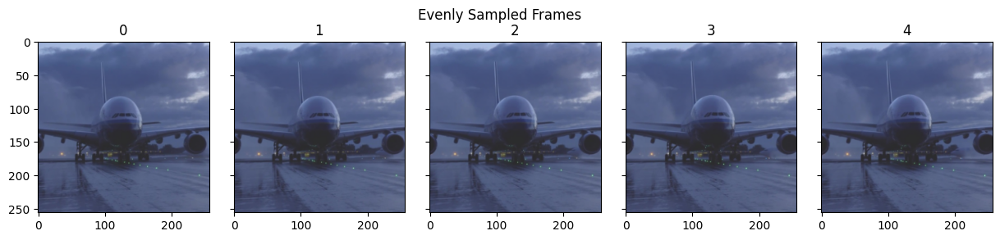

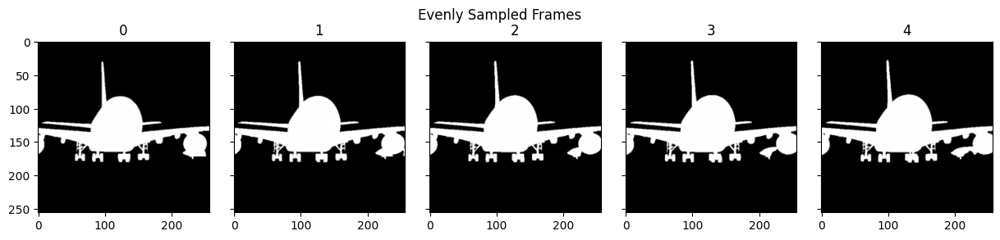

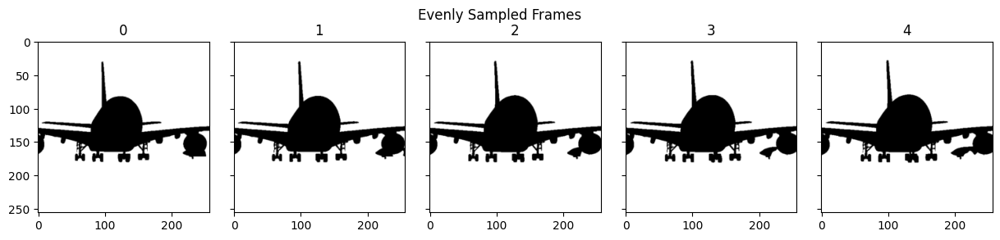

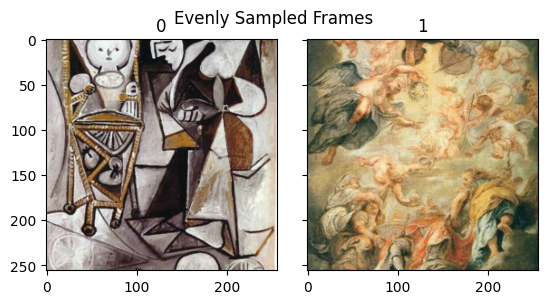

<ipython-input-5-8938b68821ba>:56: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torchvision.transforms.Lambda(lambda x : torch.tensor((x > 0), dtype=torch.float32)),
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:4316: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


[Epoch 0/2] [Batch 5/60] [C loss: 105.729362, S loss: 82.697502, R loss: 2608.123291, Z loss: 0.504802, M loss: 7.025923, T loss: 0.065098, total loss: 246.417984]
[Epoch 0/2] [Batch 6/60] [C loss: 125.632294, S loss: 182.724411, R loss: 651.636841, Z loss: 1.207231, M loss: 1.571306, T loss: 0.016867, total loss: 234.854813]
[Epoch 0/2] [Batch 7/60] [C loss: 91.346428, S loss: 178.405365, R loss: 545.906067, Z loss: 1.166502, M loss: 1.224561, T loss: 0.010090, total loss: 216.420395]
[Epoch 0/2] [Batch 8/60] [C loss: 168.546173, S loss: 143.361710, R loss: 148.973587, Z loss: 1.855839, M loss: 0.587272, T loss: 0.006110, total loss: 175.026169]
[Epoch 0/2] [Batch 9/60] [C loss: 209.483414, S loss: 62.702042, R loss: 523.898499, Z loss: 0.853752, M loss: 0.673469, T loss: 0.016706, total loss: 115.482254]


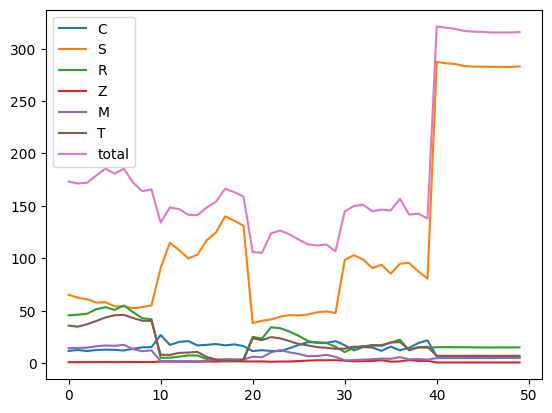

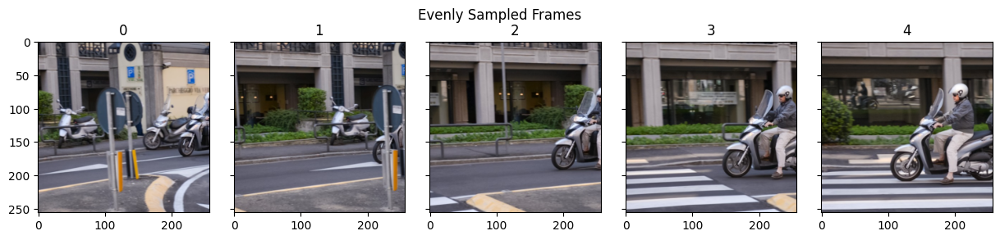

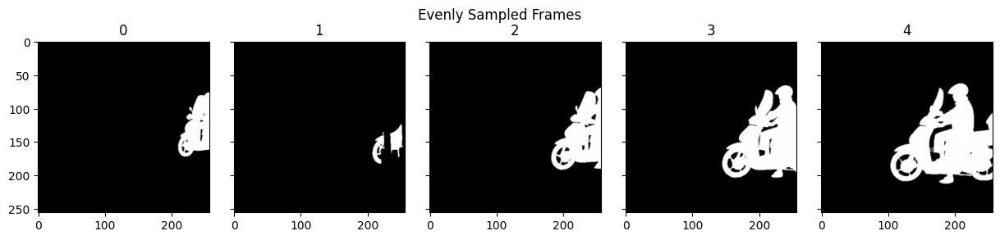

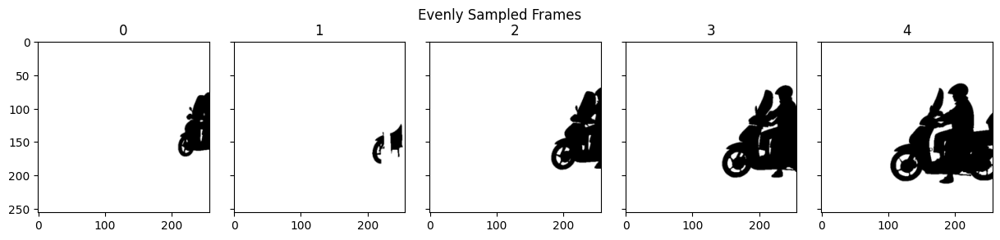

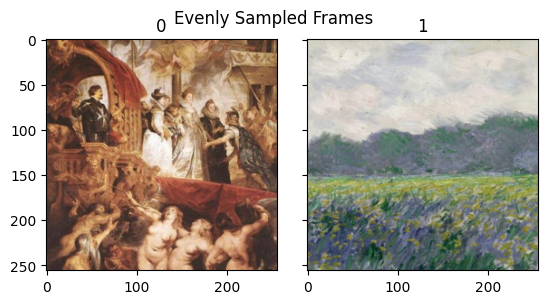

<ipython-input-5-8938b68821ba>:56: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torchvision.transforms.Lambda(lambda x : torch.tensor((x > 0), dtype=torch.float32)),
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:4316: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


[Epoch 0/2] [Batch 10/60] [C loss: 210.092331, S loss: 134.375092, R loss: 107.965851, Z loss: 1.500034, M loss: 0.629506, T loss: 0.004759, total loss: 167.700256]
[Epoch 0/2] [Batch 11/60] [C loss: 118.234505, S loss: 173.894836, R loss: 776.920227, Z loss: 0.746318, M loss: 1.553545, T loss: 0.012367, total loss: 222.510651]
[Epoch 0/2] [Batch 12/60] [C loss: 150.080917, S loss: 192.217438, R loss: 138.860321, Z loss: 1.379936, M loss: 0.739053, T loss: 0.004642, total loss: 220.409836]
[Epoch 0/2] [Batch 13/60] [C loss: 148.477905, S loss: 73.683456, R loss: 617.070312, Z loss: 0.602397, M loss: 0.978906, T loss: 0.016699, total loss: 123.369522]
[Epoch 0/2] [Batch 14/60] [C loss: 299.178833, S loss: 44.253670, R loss: 176.123611, Z loss: 1.238983, M loss: 0.467628, T loss: 0.009239, total loss: 91.129631]


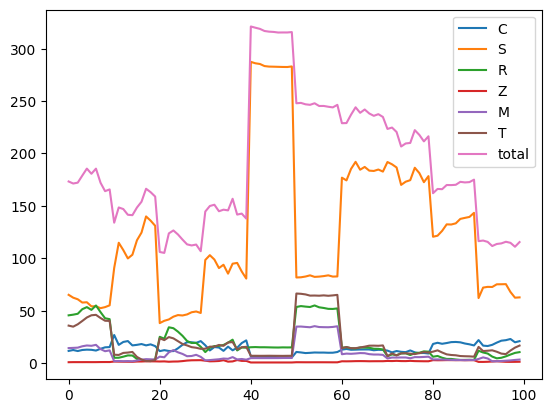

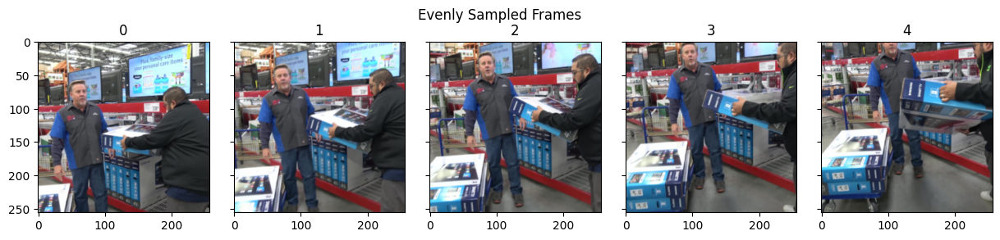

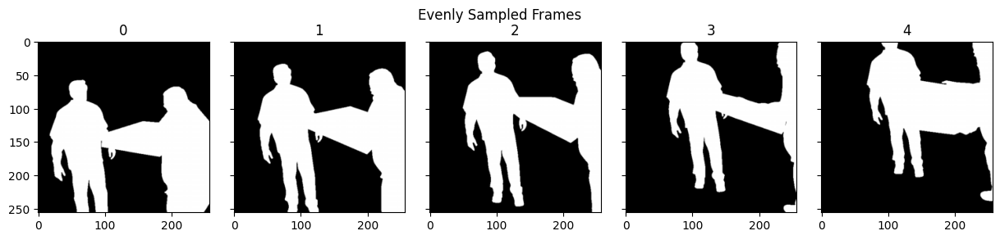

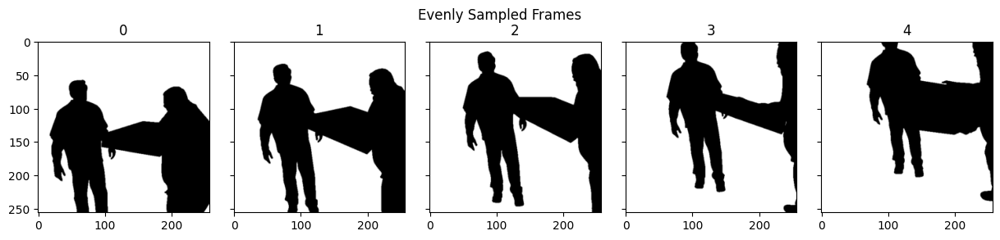

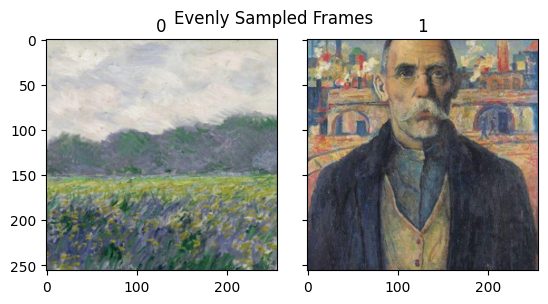

<ipython-input-5-8938b68821ba>:56: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torchvision.transforms.Lambda(lambda x : torch.tensor((x > 0), dtype=torch.float32)),
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:4316: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


[Epoch 0/2] [Batch 15/60] [C loss: 75.482681, S loss: 374.701782, R loss: 343.253815, Z loss: 0.581277, M loss: 0.770248, T loss: 0.005886, total loss: 399.724487]
[Epoch 0/2] [Batch 16/60] [C loss: 105.264389, S loss: 111.719269, R loss: 219.065536, Z loss: 1.006379, M loss: 0.548164, T loss: 0.008340, total loss: 139.217606]
[Epoch 0/2] [Batch 17/60] [C loss: 107.710762, S loss: 273.615936, R loss: 701.844788, Z loss: 1.067453, M loss: 1.355210, T loss: 0.023285, total loss: 330.086487]
[Epoch 0/2] [Batch 18/60] [C loss: 130.970886, S loss: 170.060486, R loss: 146.835358, Z loss: 0.724222, M loss: 0.438250, T loss: 0.005457, total loss: 194.829269]
[Epoch 0/2] [Batch 19/60] [C loss: 134.792404, S loss: 70.928314, R loss: 279.355988, Z loss: 1.090723, M loss: 0.624498, T loss: 0.009408, total loss: 104.161247]


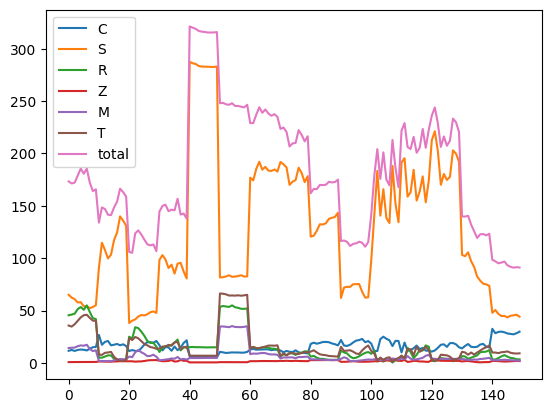

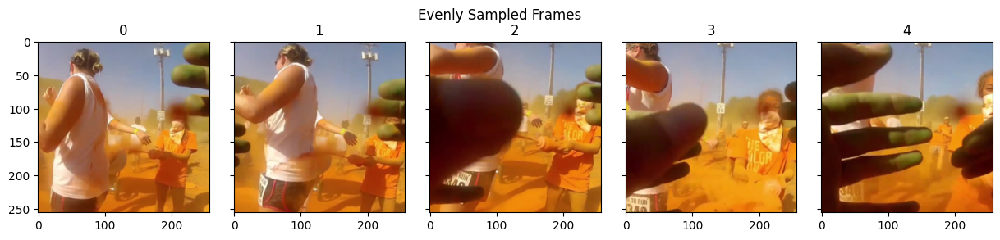

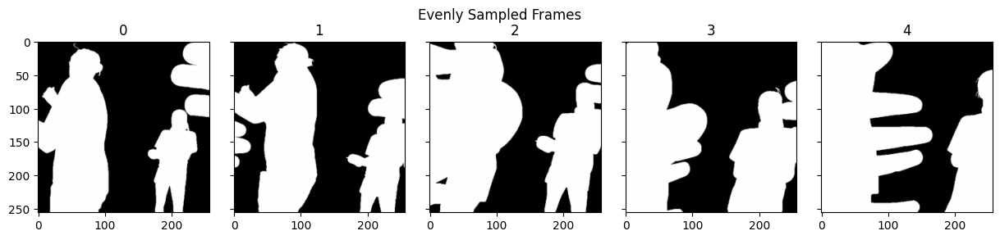

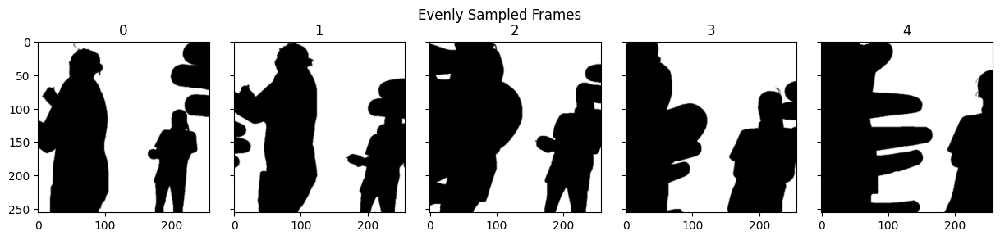

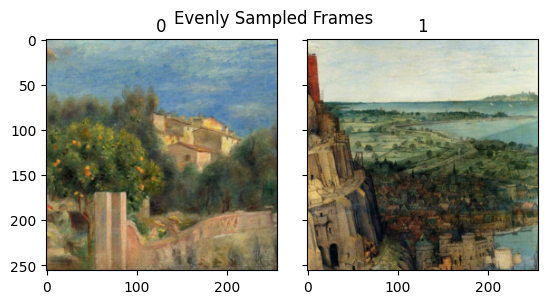

<ipython-input-5-8938b68821ba>:56: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torchvision.transforms.Lambda(lambda x : torch.tensor((x > 0), dtype=torch.float32)),
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:4316: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


[Epoch 0/2] [Batch 20/60] [C loss: 126.942650, S loss: 88.052605, R loss: 172.587830, Z loss: 1.948118, M loss: 0.764885, T loss: 0.006968, total loss: 117.913300]
[Epoch 0/2] [Batch 21/60] [C loss: 391.705994, S loss: 228.774048, R loss: 106.122650, Z loss: 1.110456, M loss: 0.451104, T loss: 0.008465, total loss: 282.452972]
[Epoch 0/2] [Batch 22/60] [C loss: 240.277344, S loss: 105.331345, R loss: 263.270355, Z loss: 1.229316, M loss: 0.591801, T loss: 0.011010, total loss: 150.437668]
[Epoch 0/2] [Batch 23/60] [C loss: 143.436218, S loss: 128.360153, R loss: 73.619469, Z loss: 1.027169, M loss: 0.590726, T loss: 0.004381, total loss: 153.051819]
[Epoch 0/2] [Batch 24/60] [C loss: 91.521278, S loss: 98.489426, R loss: 209.000214, Z loss: 0.791063, M loss: 0.388239, T loss: 0.010864, total loss: 125.813019]


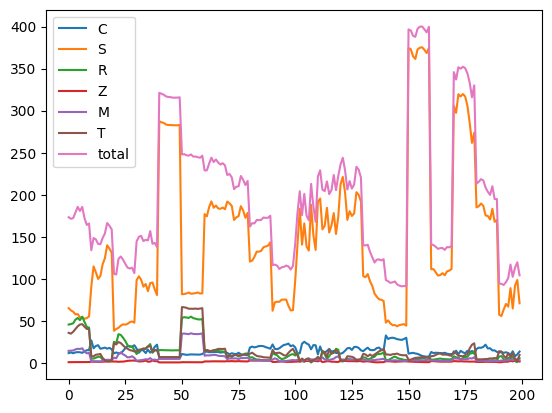

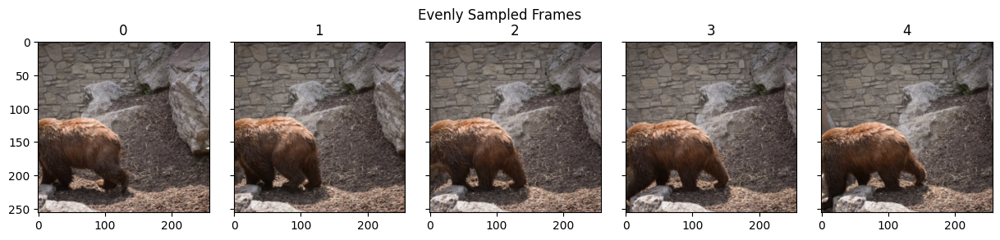

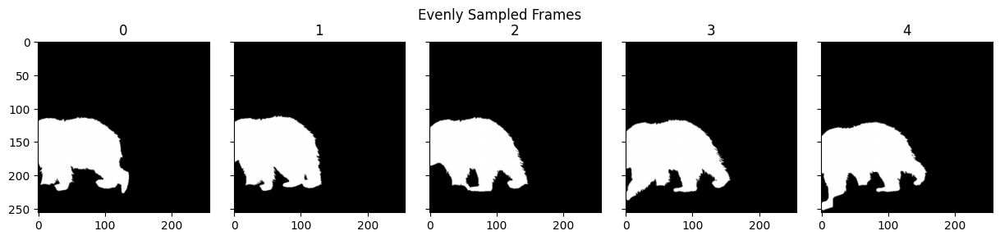

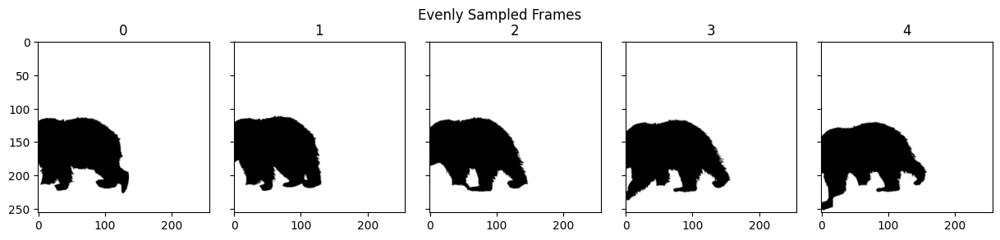

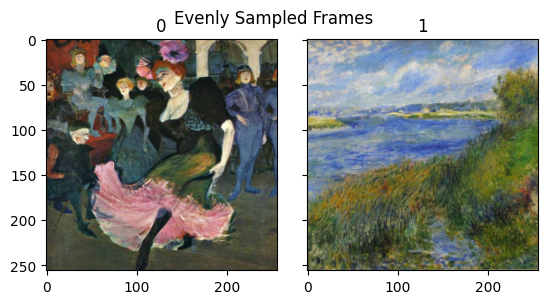

<ipython-input-5-8938b68821ba>:56: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torchvision.transforms.Lambda(lambda x : torch.tensor((x > 0), dtype=torch.float32)),
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:4316: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


[Epoch 0/2] [Batch 25/60] [C loss: 119.278091, S loss: 158.168060, R loss: 197.484039, Z loss: 0.777879, M loss: 0.268160, T loss: 0.012704, total loss: 189.256714]
[Epoch 0/2] [Batch 26/60] [C loss: 149.166458, S loss: 142.070816, R loss: 82.170273, Z loss: 1.457618, M loss: 0.680160, T loss: 0.002826, total loss: 167.043686]
[Epoch 0/2] [Batch 27/60] [C loss: 227.708557, S loss: 137.999329, R loss: 110.027527, Z loss: 1.688768, M loss: 0.625487, T loss: 0.005403, total loss: 174.033920]
[Epoch 0/2] [Batch 28/60] [C loss: 20.557558, S loss: 275.587830, R loss: 253.718430, Z loss: 1.294579, M loss: 0.778216, T loss: 0.005086, total loss: 293.636536]
[Epoch 0/2] [Batch 29/60] [C loss: 177.556427, S loss: 75.398323, R loss: 81.446716, Z loss: 1.698168, M loss: 0.705388, T loss: 0.005405, total loss: 106.261955]


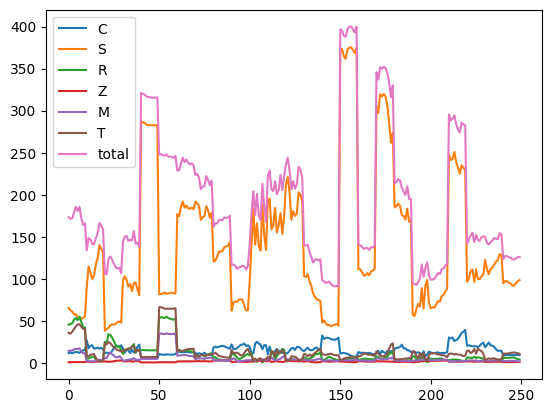

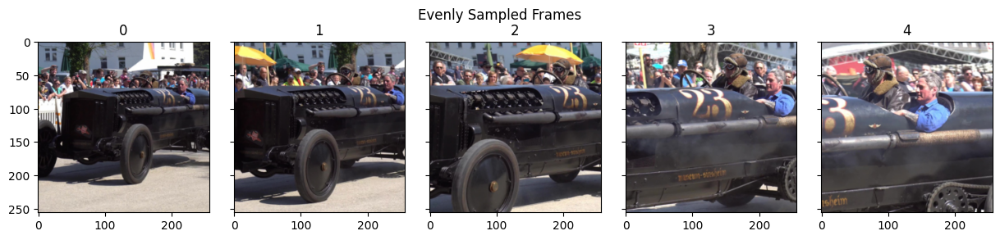

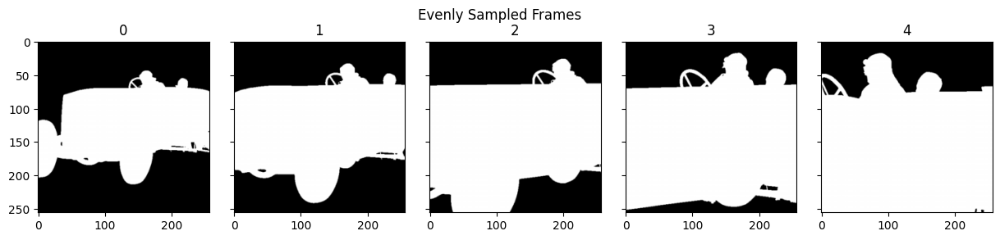

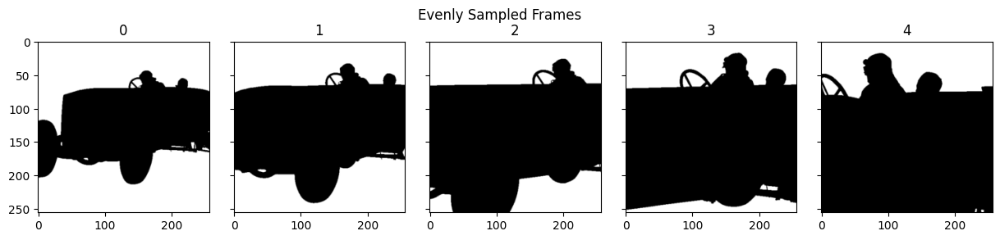

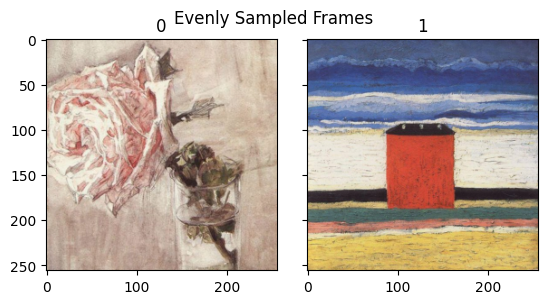

<ipython-input-5-8938b68821ba>:56: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torchvision.transforms.Lambda(lambda x : torch.tensor((x > 0), dtype=torch.float32)),
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:4316: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


[Epoch 0/2] [Batch 30/60] [C loss: 140.176620, S loss: 142.563019, R loss: 189.469559, Z loss: 1.101417, M loss: 0.729590, T loss: 0.003882, total loss: 169.551712]
[Epoch 0/2] [Batch 31/60] [C loss: 221.494263, S loss: 67.833694, R loss: 194.271042, Z loss: 0.978316, M loss: 0.521001, T loss: 0.008995, total loss: 106.936279]
[Epoch 0/2] [Batch 32/60] [C loss: 158.166336, S loss: 102.190247, R loss: 148.849213, Z loss: 0.812145, M loss: 0.394279, T loss: 0.010423, total loss: 134.596588]
[Epoch 0/2] [Batch 33/60] [C loss: 106.434563, S loss: 190.833130, R loss: 28.970100, Z loss: 1.619778, M loss: 0.742050, T loss: 0.002072, total loss: 210.268188]
[Epoch 0/2] [Batch 34/60] [C loss: 188.085068, S loss: 92.918633, R loss: 244.459030, Z loss: 0.834749, M loss: 0.420702, T loss: 0.007518, total loss: 127.490021]


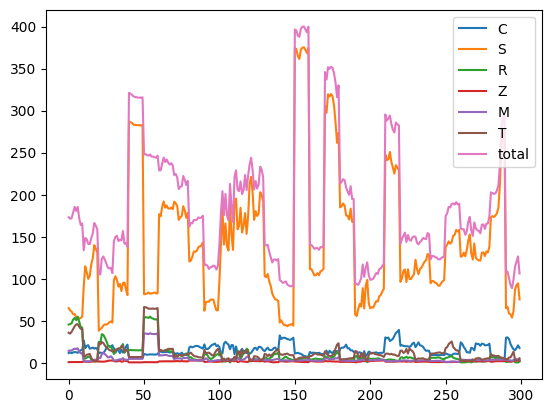

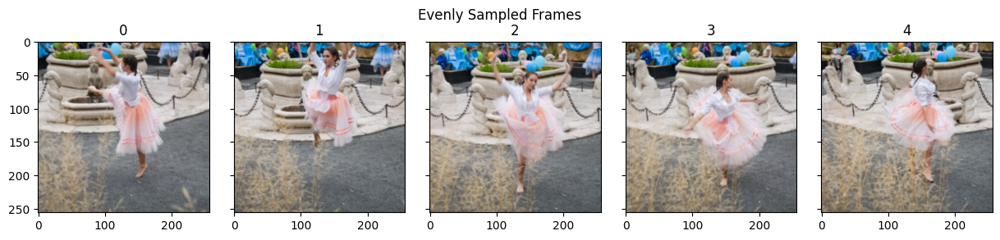

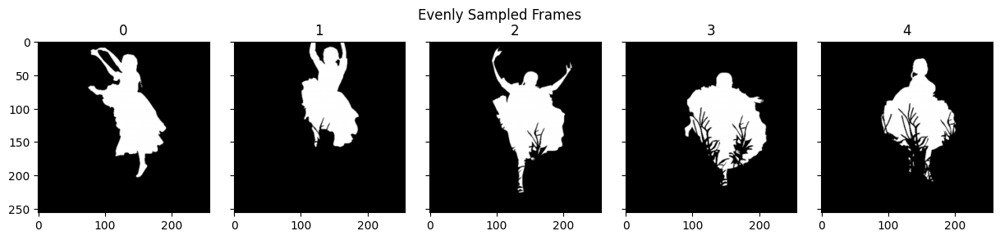

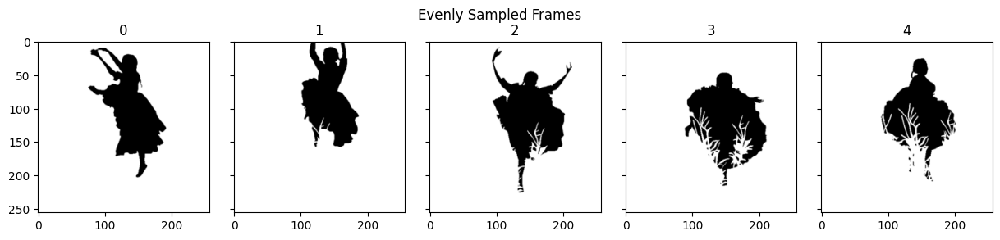

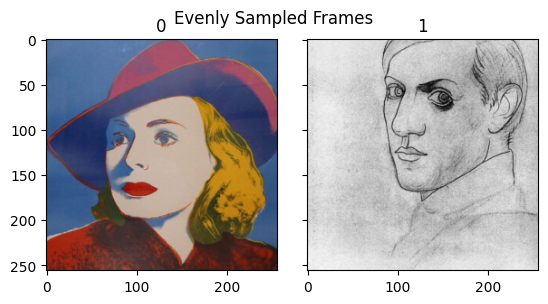

<ipython-input-5-8938b68821ba>:56: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torchvision.transforms.Lambda(lambda x : torch.tensor((x > 0), dtype=torch.float32)),
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:4316: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


[Epoch 0/2] [Batch 35/60] [C loss: 149.881775, S loss: 170.086136, R loss: 143.660385, Z loss: 1.902423, M loss: 0.580222, T loss: 0.008707, total loss: 202.409454]
[Epoch 0/2] [Batch 36/60] [C loss: 97.398758, S loss: 273.077332, R loss: 57.302662, Z loss: 1.904189, M loss: 0.846147, T loss: 0.002937, total loss: 293.987244]
[Epoch 0/2] [Batch 37/60] [C loss: 189.777969, S loss: 104.825111, R loss: 143.317261, Z loss: 0.918128, M loss: 0.467285, T loss: 0.010055, total loss: 140.437744]
[Epoch 0/2] [Batch 38/60] [C loss: 178.815399, S loss: 111.099625, R loss: 222.391586, Z loss: 0.692722, M loss: 0.278089, T loss: 0.006407, total loss: 142.265808]
[Epoch 0/2] [Batch 39/60] [C loss: 142.663544, S loss: 118.135033, R loss: 63.300968, Z loss: 1.171578, M loss: 0.702687, T loss: 0.004018, total loss: 142.956329]


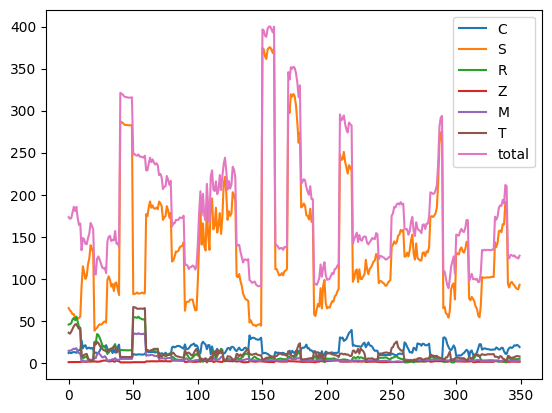

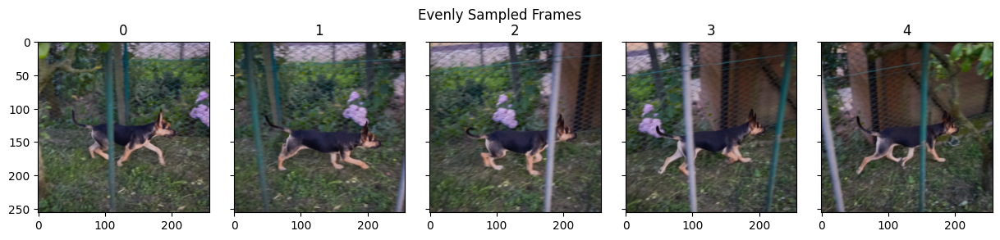

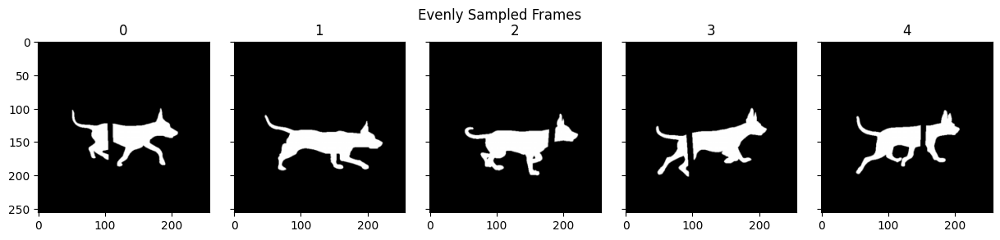

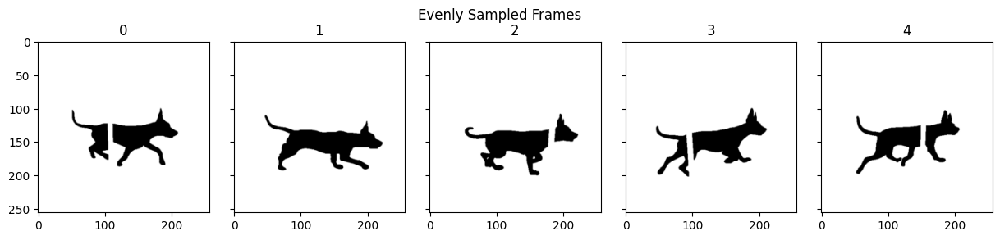

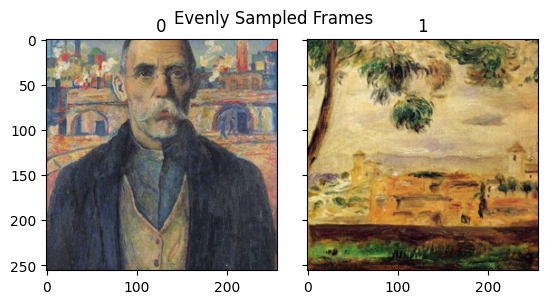

<ipython-input-5-8938b68821ba>:56: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torchvision.transforms.Lambda(lambda x : torch.tensor((x > 0), dtype=torch.float32)),
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:4316: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


[Epoch 0/2] [Batch 40/60] [C loss: 269.606079, S loss: 26.361984, R loss: 156.776871, Z loss: 1.148633, M loss: 0.597522, T loss: 0.006277, total loss: 67.445488]
[Epoch 0/2] [Batch 41/60] [C loss: 74.334831, S loss: 161.638535, R loss: 393.345306, Z loss: 0.489129, M loss: 0.610699, T loss: 0.006571, total loss: 187.297058]
[Epoch 0/2] [Batch 42/60] [C loss: 52.601559, S loss: 370.767242, R loss: 172.980286, Z loss: 1.896828, M loss: 0.741663, T loss: 0.005479, total loss: 391.519531]
[Epoch 0/2] [Batch 43/60] [C loss: 130.322678, S loss: 468.021759, R loss: 3.221518, Z loss: 2.612443, M loss: 0.970744, T loss: 0.000245, total loss: 490.135986]
[Epoch 0/2] [Batch 44/60] [C loss: 166.788910, S loss: 119.201752, R loss: 172.194046, Z loss: 1.070523, M loss: 0.575346, T loss: 0.010681, total loss: 154.488510]


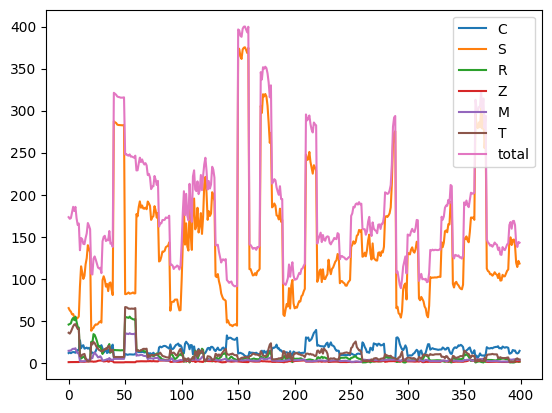

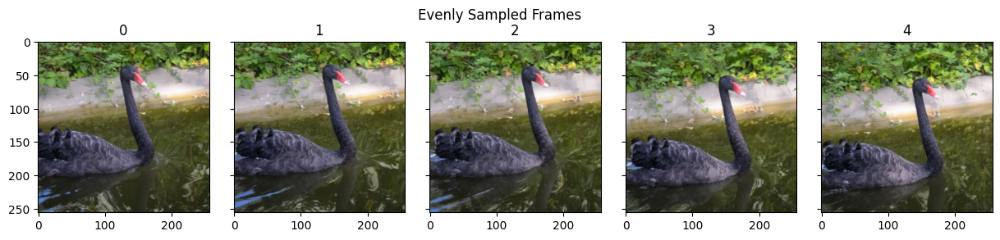

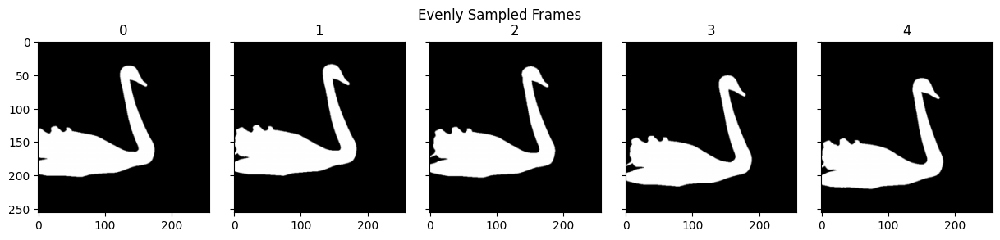

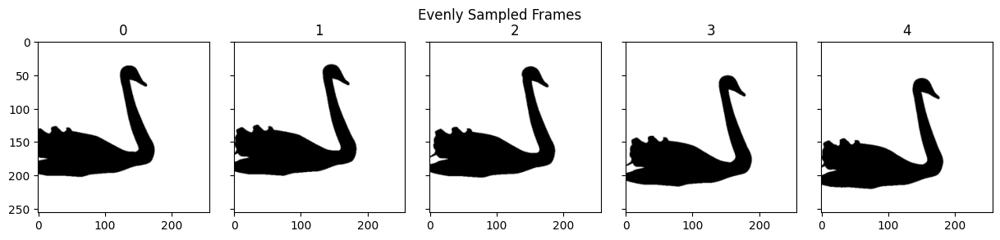

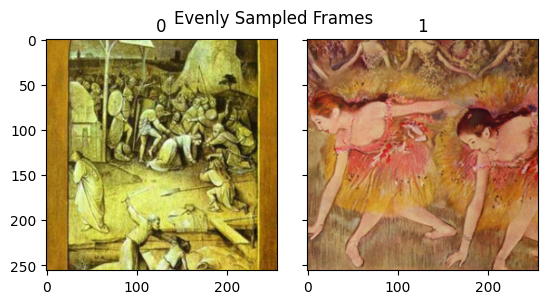

<ipython-input-5-8938b68821ba>:56: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torchvision.transforms.Lambda(lambda x : torch.tensor((x > 0), dtype=torch.float32)),
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:4316: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


[Epoch 0/2] [Batch 45/60] [C loss: 283.574768, S loss: 92.813553, R loss: 233.133896, Z loss: 0.697763, M loss: 0.497168, T loss: 0.006971, total loss: 136.337128]
[Epoch 0/2] [Batch 46/60] [C loss: 75.751160, S loss: 153.188629, R loss: 663.387756, Z loss: 0.219082, M loss: 0.423235, T loss: 0.013219, total loss: 189.695602]
[Epoch 0/2] [Batch 47/60] [C loss: 387.428406, S loss: 95.990784, R loss: 197.198364, Z loss: 0.882710, M loss: 0.532600, T loss: 0.007660, total loss: 150.324936]


In [ ]:
args = {}
args['cont_vids_path'] = vid_root #/vids
args['cont_mask_vids_path'] = mask_root #/mask_vids
args['annotations_path_train'] = annotations_file_train #/mask_vids
args['annotations_path_val'] = annotations_file_val #/mask_vids
args['style_imgs_path'] = style_root #/style_images
args['num_classes'] = 2
args['batch_size'] = 1
args['checkpoint_path'] = checkpoints_root
args['output_path'] = sample_output_root
args['log_interval'] = 5
args['ckpt_interval'] = 10

train(args)


# Visualize results

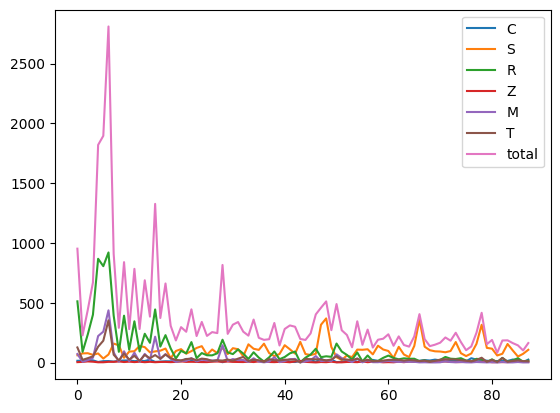

In [26]:
c_loss_hist = np.array([144.981750, 155.145538, 207.047760, 181.770782, 46.275047, 116.261932, 123.238510, 79.394676, 142.957550, 170.026947, 172.311188, 115.603149, 131.983856, 127.645416, 239.868286, 57.728806, 80.612991, 104.320778, 99.934242, 131.797928, 98.410713, 304.043579, 203.809967, 113.947685, 77.409058, 101.955872, 109.151360, 176.727768, 26.804996, 140.550873, 113.877129, 164.733124, 126.670746, 80.682091, 146.051422, 122.923920, 95.027603, 161.743622, 154.884048, 127.180389, 223.950104, 56.970333, 45.324284, 125.164680, 139.348831, 213.770935, 59.619209, 309.305389, 116.407730, 240.719330, 33.004505, 66.694901, 128.490601, 218.754059, 61.405163, 109.447876, 152.524658, 219.218842, 133.521576, 66.935593, 138.724823, 132.029877, 172.540466, 62.723385, 104.360840, 74.652924, 146.592606, 204.885193, 170.226318, 243.023468, 183.165161, 107.280243, 130.059586, 128.558563, 194.811096, 93.885353, 360.384277, 239.715775, 222.385895, 151.890823, 124.405724, 126.006905, 144.274338, 134.088074, 249.883881, 223.494278, 44.073864, 243.586014])
s_loss_hist = np.array([61.092400, 76.423065, 77.909882, 64.475716, 75.915482, 33.513226, 67.189209, 158.245926, 144.283905, 40.017273, 91.536613, 94.800156, 138.888992, 128.759766, 85.292847, 93.105499, 98.987640, 116.858627, 36.842098, 96.497269, 111.940414, 74.222824, 95.400078, 121.975159, 136.891876, 64.910027, 109.079590, 78.788025, 121.872116, 70.613388, 119.961563, 111.253838, 52.166889, 152.240967, 115.216141, 105.800079, 157.720535, 79.029839, 53.819698, 71.310509, 144.936920, 110.612579, 74.297676, 173.175430, 71.077400, 62.908546, 73.342697, 315.992432, 368.958313, 129.702515, 44.353649, 21.625309, 58.901112, 45.317051, 108.196594, 106.462097, 111.138680, 68.398682, 140.614212, 108.864288, 96.664459, 38.457550, 131.387650, 67.311172, 45.506580, 138.678268, 359.115356, 132.586273, 103.058609, 93.883110, 92.081696, 85.800819, 96.321457, 171.382324, 77.989395, 54.190720, 75.492912, 156.067444, 315.809998, 122.680351, 115.894524, 59.008492, 73.348770, 155.015640, 101.295258, 50.261101, 72.985382, 106.430550])
r_loss_hist = np.array([25580.347656, 4455.186523, 11730.109375, 20006.830078, 43373.722656, 40283.417969, 46019.667969, 19623.253906, 4484.250977, 19580.966797, 5365.229980, 17246.369141, 4640.137695, 12028.272461, 8252.525391, 22186.349609, 6668.583984, 11453.666992, 5904.689453, 1699.045288, 4895.381348, 3848.377930, 8538.980469, 1833.093506, 3964.874268, 3033.196045, 3004.888672, 3876.340088, 9532.727539, 4241.548340, 3533.766602, 5477.067383, 3753.817139, 1497.691528, 4293.434570, 2046.241211, 431.306366, 2171.297852, 4635.687500, 1363.063599, 2312.619141, 3847.712158, 4594.971680, 100.550125, 2008.662964, 3346.119629, 5775.832031, 2247.080322, 2609.062256, 2378.707520, 7939.132812, 4603.344238, 3184.526123, 1239.906982, 4205.462402, 468.406372, 2946.392578, 651.658569, 683.970398, 1956.294556, 2906.050537, 1924.888550, 1346.086792, 1752.936157, 1574.442505, 1590.027100, 624.966553, 882.307922, 311.526642, 547.136230, 1096.436890, 2339.531738, 1608.693359, 1472.621094, 1812.056274, 817.284363, 397.070831, 1543.787476, 1340.708008, 203.089615, 1333.367554, 161.288132, 1933.445801, 343.642365, 873.628662, 1811.059204, 336.974945, 800.828857])
z_loss_hist = np.array([0.665869, 1.089952, 1.862509, 1.383499, 0.452565, 0.467008, 1.190007, 1.135485, 1.835136, 0.851068, 1.483775, 0.748640, 1.377825, 0.593433, 1.236599, 0.540554, 0.990175, 1.060705, 0.704710, 1.072605, 1.926663, 1.094920, 1.232368, 1.010687, 0.794842, 0.764337, 1.433829, 1.690068, 1.277073, 1.698999, 1.097834, 0.968980, 0.817957, 1.598843, 0.818451, 1.894506, 1.904628, 0.920094, 0.691910, 1.179087, 1.148910, 0.500981, 1.872931, 2.615970, 1.069456, 0.683356, 0.219756, 0.885675, 0.592060, 1.446804, 0.367397, 0.355089, 0.977180, 0.965789, 0.611739, 1.857890, 0.575968, 1.439069, 1.119329, 0.418940, 0.684893, 0.419969, 1.404586, 0.584131, 1.754110, 1.460569, 1.428283, 1.502647, 1.410197, 1.682954, 1.342227, 1.982033, 1.061044, 0.780836, 0.758086, 1.354010, 1.822972, 1.058380, 1.202416, 1.751094, 0.506067, 0.789240, 0.653610, 0.808794, 1.238238, 1.163186, 1.639824, 1.141042])
m_loss_hist = np.array([47.527287, 4.403300, 13.424600, 26.572147, 147.690231, 172.270584, 291.012665, 56.483795, 4.327558, 62.748821, 7.329379, 54.973179, 3.901135, 48.163376, 14.320862, 144.122681, 19.774899, 47.252636, 20.815845, 3.554622, 10.992043, 9.067833, 24.463379, 6.251572, 16.301159, 11.598837, 11.807487, 9.998766, 96.461143, 8.529714, 19.405323, 13.496998, 14.043315, 3.920744, 23.768299, 5.112329, 1.212147, 5.323231, 29.625711, 2.352397, 8.397186, 18.347929, 20.383102, 0.890474, 6.448505, 12.646448, 36.026814, 7.856730, 11.916242, 8.369246, 45.857155, 24.737280, 13.795971, 2.647506, 22.681927, 1.249764, 13.127020, 2.010252, 1.830252, 5.490120, 8.924850, 5.208325, 3.576982, 4.218085, 4.229168, 4.005199, 0.973641, 1.444180, 0.684074, 0.614456, 1.420782, 7.027743, 2.688302, 1.770849, 3.145343, 1.157827, 0.713326, 2.894207, 1.782033, 0.662643, 2.021453, 0.338599, 3.687726, 0.617475, 0.752695, 2.869132, 0.586244, 0.815178])
t_loss_hist = np.array([0.126218, 0.022477, 0.036335, 0.051980, 0.132273, 0.182619, 0.352945, 0.065382, 0.017514, 0.075761, 0.024529, 0.056081, 0.013816, 0.063986, 0.036075, 0.062464, 0.031670, 0.066729, 0.037162, 0.021624, 0.018397, 0.028731, 0.034019, 0.018821, 0.032877, 0.027646, 0.013247, 0.019517, 0.016366, 0.024926, 0.015744, 0.032406, 0.046755, 0.012729, 0.023458, 0.019203, 0.004726, 0.028478, 0.019526, 0.017660, 0.023344, 0.024536, 0.023786, 0.001300, 0.029670, 0.028384, 0.027359, 0.025687, 0.017898, 0.025144, 0.052826, 0.025464, 0.024574, 0.021338, 0.032166, 0.012303, 0.023535, 0.009783, 0.012294, 0.016384, 0.021958, 0.023345, 0.023132, 0.016154, 0.021794, 0.018263, 0.011378, 0.015950, 0.005314, 0.014539, 0.024476, 0.028195, 0.026254, 0.025249, 0.020357, 0.015599, 0.008792, 0.021902, 0.040337, 0.005612, 0.022924, 0.004240, 0.038484, 0.006121, 0.013112, 0.018686, 0.011731, 0.010365])
loss_hist = np.array([952.051086, 227.170288, 439.468750, 669.705200, 1819.419922, 1895.480591, 2809.699707, 908.154785, 290.169037, 839.421509, 279.473877, 783.357544, 280.278534, 687.782410, 383.864197, 1326.493408, 372.450867, 660.946960, 307.227631, 184.663513, 295.936646, 257.306976, 444.744995, 221.626831, 339.504852, 222.556702, 254.527802, 246.033051, 815.794250, 239.622055, 316.442474, 338.612549, 258.108643, 224.994156, 359.216675, 206.623550, 189.493057, 195.104233, 330.714264, 142.480255, 280.637695, 310.291412, 299.240021, 197.378815, 188.702423, 243.848953, 402.643494, 458.163269, 511.147644, 270.509155, 489.099792, 270.044495, 230.460541, 128.014343, 344.939941, 148.114120, 275.352722, 125.346970, 190.770203, 199.146484, 236.267593, 140.174881, 218.687317, 146.762543, 133.002075, 218.424332, 404.662994, 196.145370, 137.161835, 149.263443, 165.919907, 209.626053, 182.788605, 248.965408, 170.932343, 103.344460, 134.565536, 248.875488, 415.913818, 153.483032, 188.793045, 81.952209, 184.348190, 185.718597, 162.489410, 143.608383, 101.254593, 162.958679])
plt.plot(range(len(loss_hist)), 0.1 * c_loss_hist, label='C')
plt.plot(range(len(loss_hist)), s_loss_hist, label='S')
plt.plot(range(len(loss_hist)), 0.02*r_loss_hist, label='R')
plt.plot(range(len(loss_hist)), 5*z_loss_hist, label='Z')
plt.plot(range(len(loss_hist)), 1.5*m_loss_hist, label='M')
plt.plot(range(len(loss_hist)), 1000*t_loss_hist, label='T')
plt.plot(range(len(loss_hist)), loss_hist, label='total')
plt.legend()
plt.savefig('/content/temp.png')
plt.show()

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:07<00:00, 81.9MB/s]
<ipython-input-7-53b70dec34af>:56: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torchvision.transforms.Lambda(lambda x : torch.tensor((x > 0), dtype=torch.float32)),


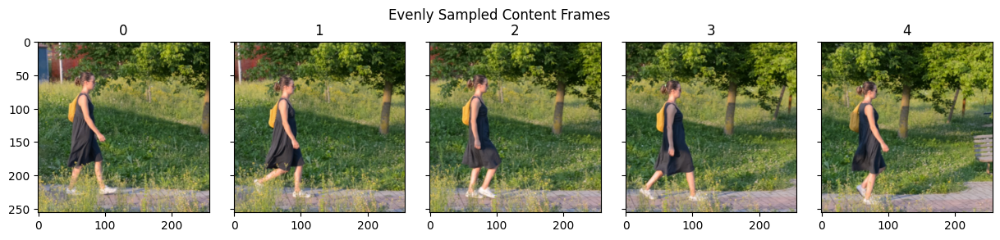

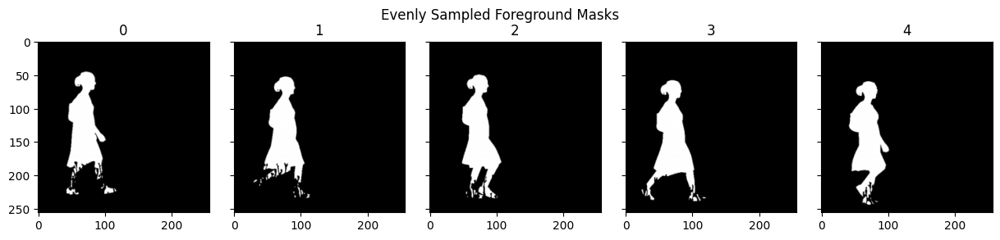

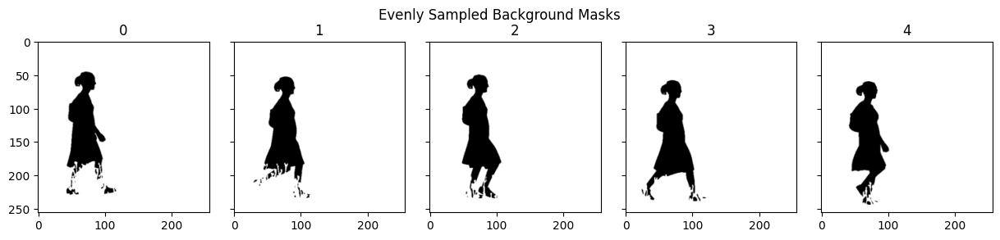

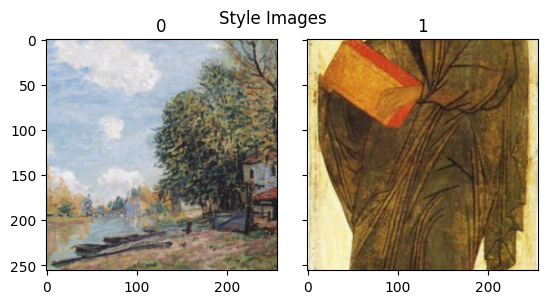

/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


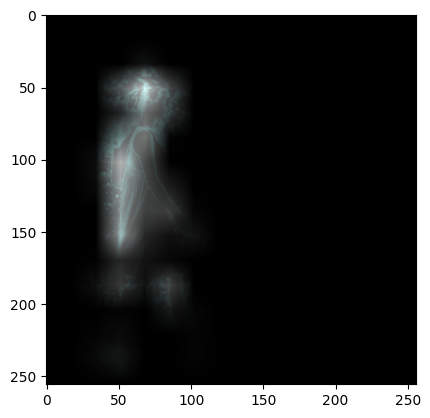

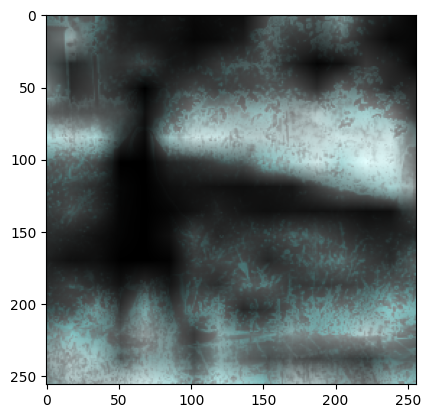

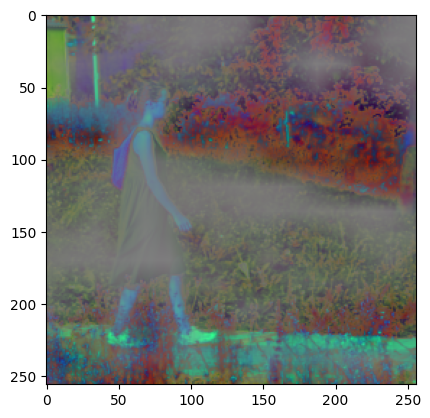

out min max :  tensor(-1.2091, grad_fn=<MinBackward1>) tensor(1.1782, grad_fn=<MaxBackward1>)


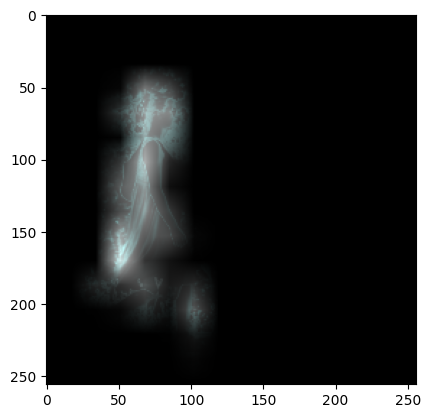

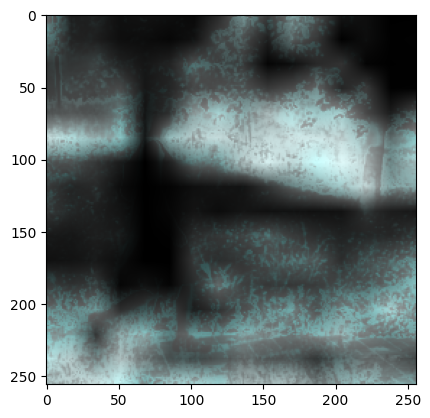

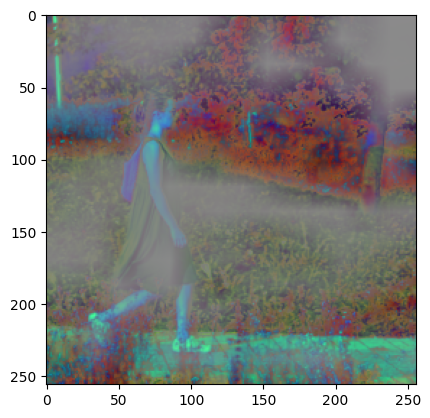

out min max :  tensor(-1.2461, grad_fn=<MinBackward1>) tensor(1.0289, grad_fn=<MaxBackward1>)


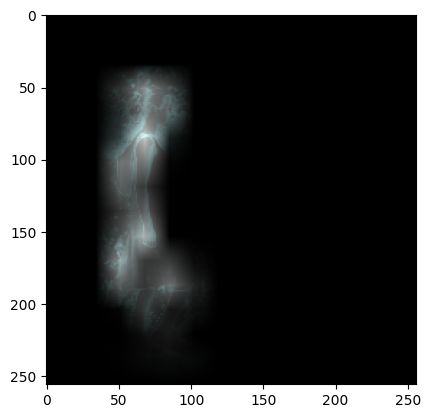

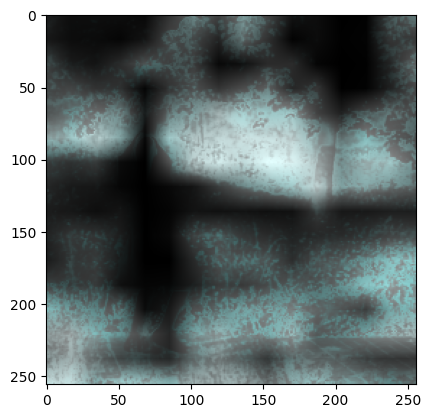

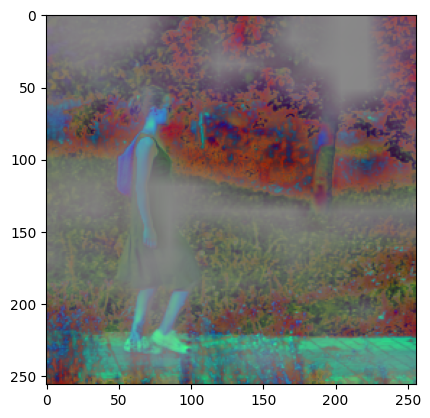

out min max :  tensor(-1.1608, grad_fn=<MinBackward1>) tensor(0.9878, grad_fn=<MaxBackward1>)


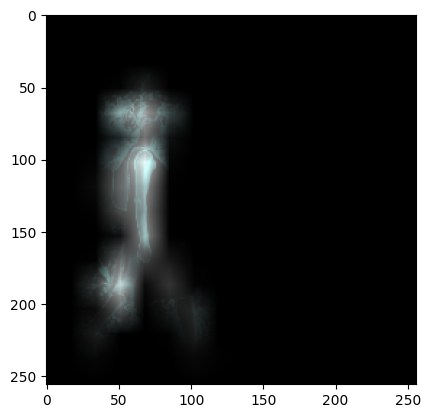

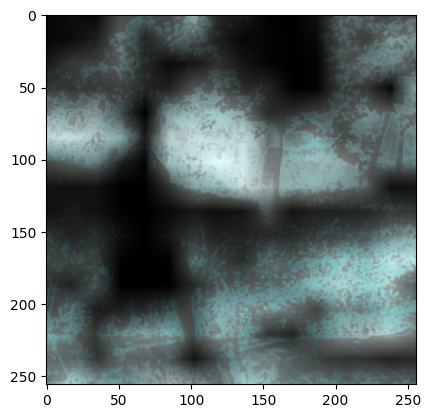

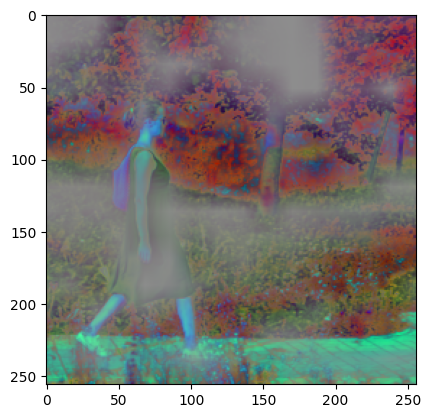

out min max :  tensor(-1.1687, grad_fn=<MinBackward1>) tensor(0.9275, grad_fn=<MaxBackward1>)


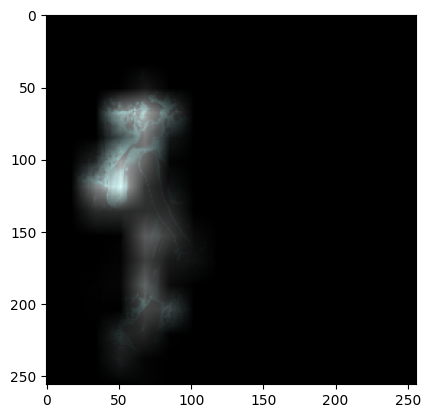

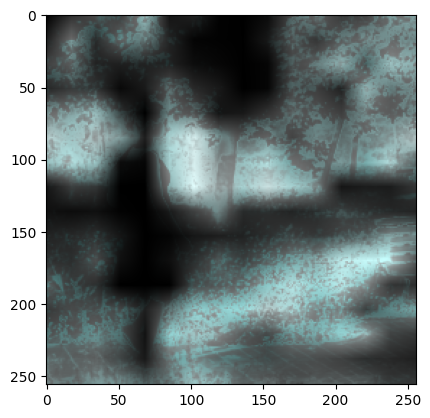

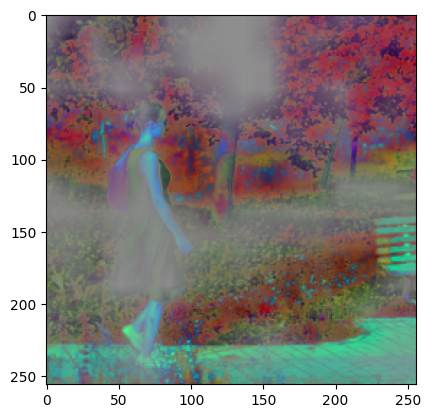

out min max :  tensor(-1.1498, grad_fn=<MinBackward1>) tensor(0.8876, grad_fn=<MaxBackward1>)


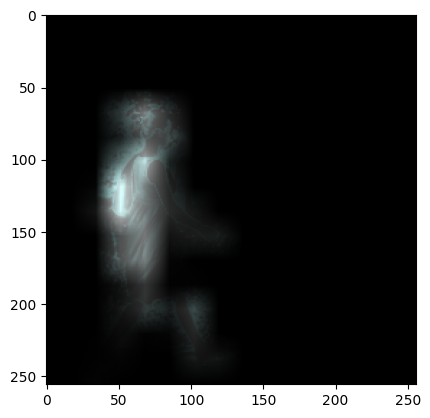

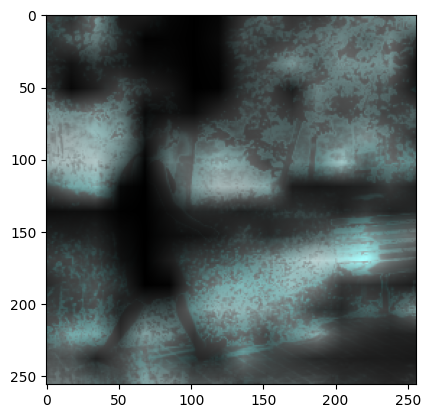

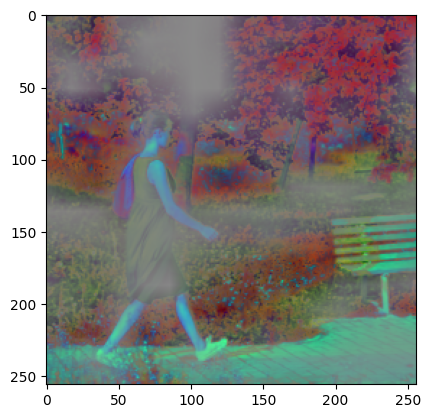

out min max :  tensor(-1.2480, grad_fn=<MinBackward1>) tensor(1.0545, grad_fn=<MaxBackward1>)


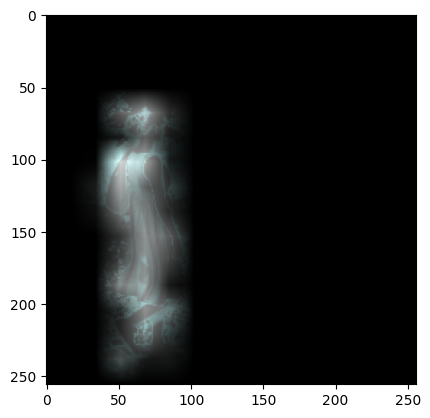

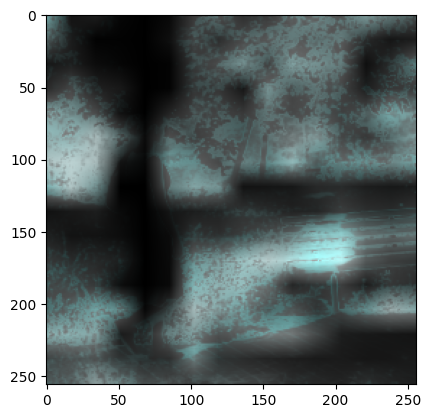

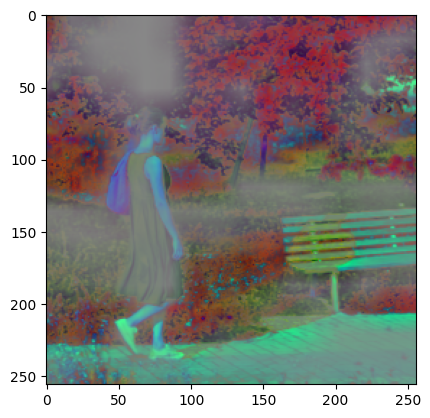

out min max :  tensor(-1.2194, grad_fn=<MinBackward1>) tensor(1.0629, grad_fn=<MaxBackward1>)


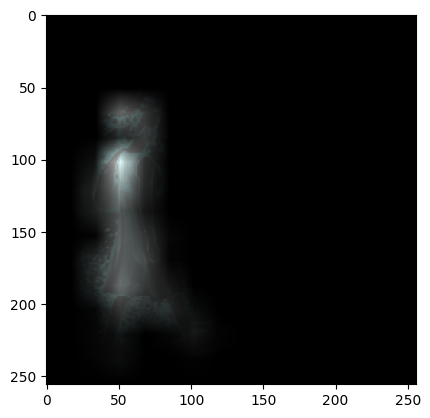

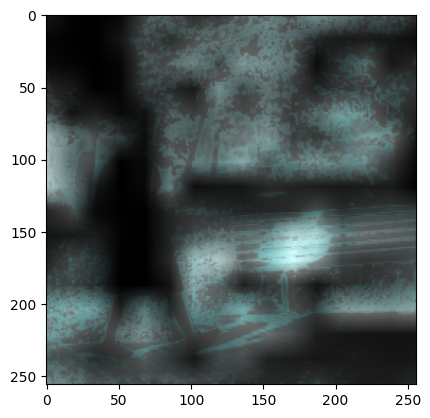

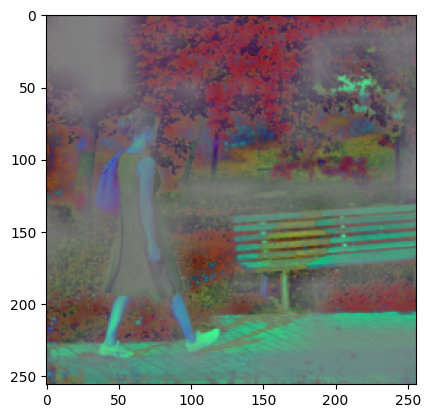

out min max :  tensor(-1.2929, grad_fn=<MinBackward1>) tensor(1.2679, grad_fn=<MaxBackward1>)


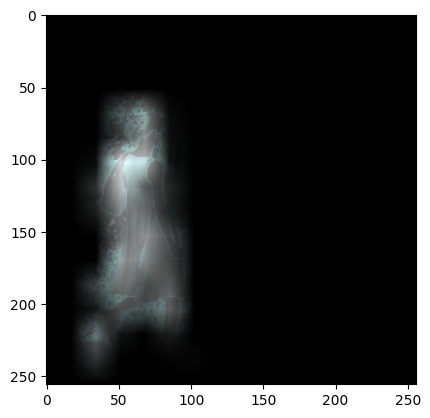

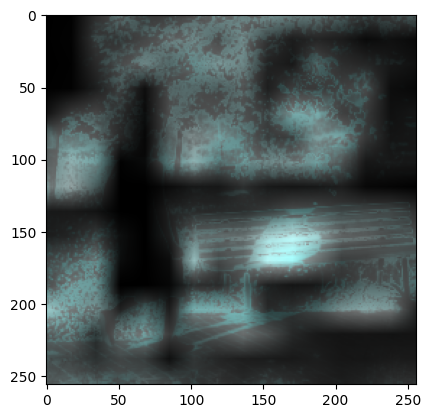

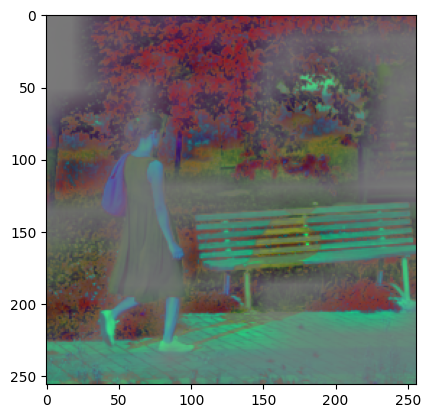

out min max :  tensor(-1.2316, grad_fn=<MinBackward1>) tensor(1.3447, grad_fn=<MaxBackward1>)


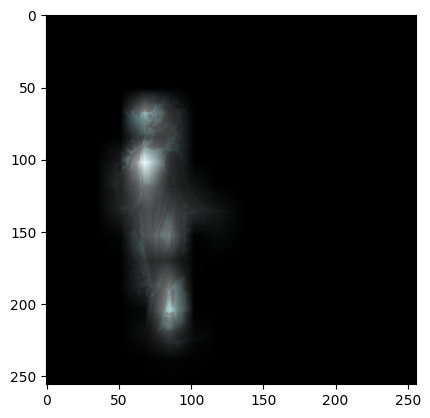

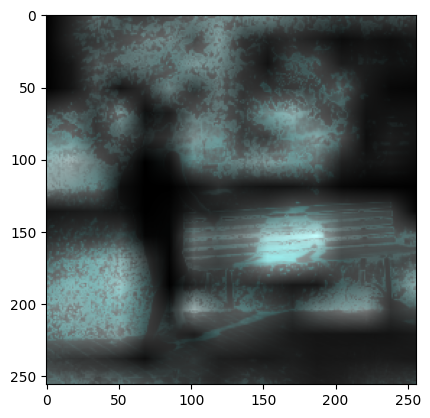

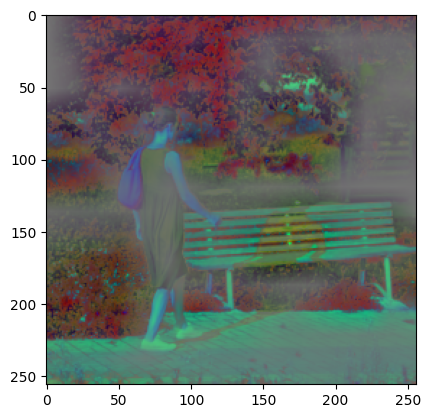

out min max :  tensor(-1.1877, grad_fn=<MinBackward1>) tensor(1.3936, grad_fn=<MaxBackward1>)
torch.Size([10, 3, 256, 256])
denormalized out min max :  34 195


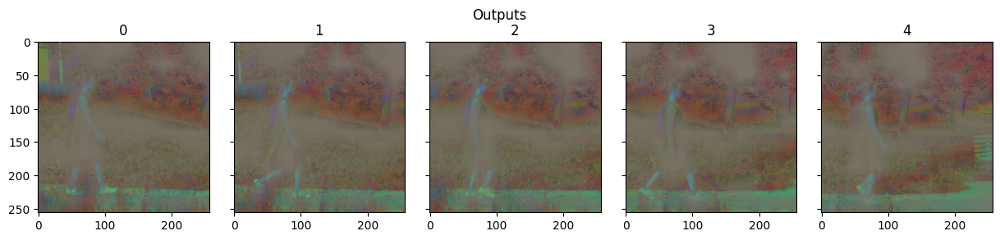

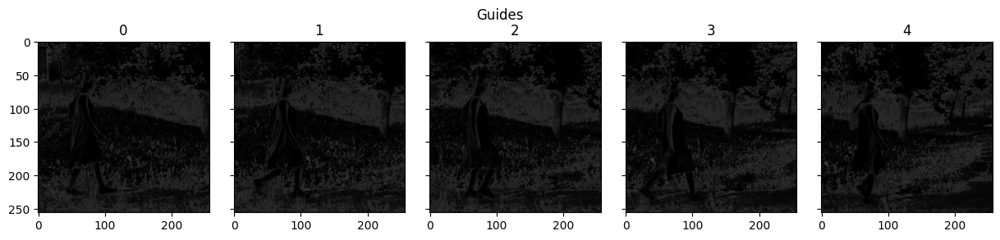

In [23]:
infer_vgg_feature_extractor = get_VGG_feature_extractor().to(device)
infer_slice = Slice().to(device)
infer_apply = ApplyCoeffs().to(device)
infer_model = MaskedVideoStyleTransfer(infer_slice, infer_apply).to(device)
checkpoint = torch.load(checkpoints_root + '/ckpt_last.pth')
infer_model.load_state_dict(checkpoint)
infer_model.eval()
count = 0
cpe_1_all_ = torch.tensor(np.zeros((batch_size, num_classes, 64, 256, 256)), dtype=torch.float32).to(device)
cpe_2_all_ = torch.tensor(np.zeros((batch_size, num_classes, 128, 128, 128)), dtype=torch.float32).to(device)
cpe_3_all_ = torch.tensor(np.zeros((batch_size, num_classes, 256, 64, 64)), dtype=torch.float32).to(device)
cpe_4_all_ = torch.tensor(np.zeros((batch_size, num_classes, 512, 32, 32)), dtype=torch.float32).to(device)
adap_1_all_ = torch.tensor(np.zeros((batch_size, num_classes, 8, 128, 128)), dtype=torch.float32).to(device)
adap_2_all_ = torch.tensor(np.zeros((batch_size, num_classes, 16, 64, 64)), dtype=torch.float32).to(device)
adap_3_all_ = torch.tensor(np.zeros((batch_size, num_classes, 32, 32, 32)), dtype=torch.float32).to(device)
output_prev_ = torch.tensor(np.zeros((batch_size, 3, 256, 256)), dtype=torch.float32).to(device)
mask_img_list_prev_ = torch.tensor(np.zeros((batch_size, num_classes, 3, 256, 256)), dtype=torch.float32).to(device)
random_idx = np.random.randint(15)
for i ,(cont_imgs, mask_img_lists, style_img_lists) in enumerate(train_loader):
    if i < random_idx:
        continue
    #cont_img is B x num_frames x 3 x 256 x 256
    plot_video(rows=1, cols=5, frame_list=denormalize(cont_imgs[0]), plot_width=15., plot_height=3.,
               title='Evenly Sampled Content Frames')
    plot_video(rows=1, cols=5, frame_list=(mask_img_lists[0][0] * 255).type(torch.uint8).permute(0,2,3,1).numpy(), plot_width=15., plot_height=3.,
               title='Evenly Sampled Foreground Masks')
    plot_video(rows=1, cols=5, frame_list=(mask_img_lists[0][1] * 255).type(torch.uint8).permute(0,2,3,1).numpy(), plot_width=15., plot_height=3.,
               title='Evenly Sampled Background Masks')
    plot_video(rows=1, cols=2, frame_list=denormalize(style_img_lists[0]), plot_width=15., plot_height=3.,
               title='Style Images')

    output_frames = []
    guides = []
    for frame_idx in range(cont_imgs.shape[1]):
        cont_img = cont_imgs[:,frame_idx,:,:,:].to(device)
        mask_img_list = mask_img_lists[:,:,frame_idx,:,:,:].to(device)
        style_img_list = style_img_lists.to(device)
        # print('training: ', i, cont_img.shape, (mask_img_list.shape), (style_img_list.shape))

        all_cont_feats = infer_vgg_feature_extractor(cont_img)
        cont_feat = all_cont_feats['layer4']
        all_style_feats_list = [infer_vgg_feature_extractor(style_img_list[:,i,:,:,:]) for i in range(num_classes)]
        style_feat_list = [all_style_feats_list[i]['layer4'] for i in range(num_classes)]

        output, blended_grid, soft_grid_mask_f, soft_grid_mask_b, guide, cpe_1_all_, cpe_2_all_, cpe_3_all_, cpe_4_all_, adap_1_all_, adap_2_all_, adap_3_all_ = infer_model(cont_img, mask_img_list, style_img_list, mask_img_list_prev_, cpe_1_all_, cpe_2_all_, cpe_3_all_, cpe_4_all_, adap_1_all_, adap_2_all_, adap_3_all_)
        soft_grid_mask_f_ = soft_grid_mask_f.reshape(soft_grid_mask_f.shape[0],12,-1,soft_grid_mask_f.shape[-2],soft_grid_mask_f.shape[-1])
        soft_grid_mask_b_ = soft_grid_mask_b.reshape(soft_grid_mask_b.shape[0],12,-1,soft_grid_mask_b.shape[-2],soft_grid_mask_b.shape[-1])
        reconstructed_mask_f = infer_apply(infer_slice(soft_grid_mask_f_, guide), guide)
        reconstructed_mask_b = infer_apply(infer_slice(soft_grid_mask_b_, guide), guide)

        grid_f = make_grid(reconstructed_mask_f, nrow=1, normalize = True)
        grid_b = make_grid(reconstructed_mask_b, nrow=1, normalize = True)
        grid_out = make_grid(output, nrow=1, normalize = True)
        # print(grid_f.shape, grid_f.min(), grid_f.max())
        # print(grid_f.shape, grid_f.min(), grid_f.max())
        plt.imshow(grid_f.cpu().detach().permute(1,2,0).numpy())
        plt.show()
        plt.imshow(grid_b.cpu().detach().permute(1,2,0).numpy())
        plt.show()
        plt.imshow(grid_out.cpu().detach().permute(1,2,0).numpy())
        plt.show()
        print('out min max : ', output.min(), output.max())
        output_frames.append(output)
        guides.append(guide.detach().repeat(1, 3,1,1))
        # break
    output_frames_tensor = torch.cat(output_frames, dim=0).to(device)
    print(output_frames_tensor.shape)
    denormalized_output = denormalize(output_frames_tensor.cpu())
    print('denormalized out min max : ', np.min(denormalized_output), np.max(denormalized_output))
    plot_video(rows=1, cols=5, frame_list=denormalized_output, plot_width=15., plot_height=3.,
               title='Outputs')
    plot_video(rows=1, cols=5, frame_list=(torch.cat(guides, dim = 0) * 255).type(torch.uint8).permute(0,2,3,1).cpu().numpy(), plot_width=15., plot_height=3.,
               title='Guides')
    count += 1
    if count > 0:
        break
# output, blended_grid, soft_grid_mask, guide, cpe_1_all, cpe_2_all, cpe_3_all, cpe_4_all, adap_1_all, adap_2_all, adap_3_all = infer_model(cont_img,mask_img_list, style_img_list, mask_img_list_prev, cpe_1_all, cpe_2_all, cpe_3_all, cpe_4_all, adap_1_all, adap_2_all, adap_3_all)

# out = make_grid(output, nrow=batch_size, normalize=True)
# save_image(out, output_file + 'output'+str(epoch)+'.jpg', normalize=False)


torch.Size([1, 2, 3, 256, 256])
torch.Size([256, 256])
tensor(0.) tensor(3.0000)
torch.Size([1, 96, 16, 16])
torch.Size([16, 16])
tensor(0., grad_fn=<MinBackward1>) tensor(605.6953, grad_fn=<MaxBackward1>)
torch.Size([1, 96, 16, 16])
torch.Size([16, 16])
tensor(0., grad_fn=<MinBackward1>) tensor(1246.6211, grad_fn=<MaxBackward1>)
torch.Size([1, 96, 16, 16])
torch.Size([16, 16])
tensor(-46.9167, grad_fn=<MinBackward1>) tensor(-0.1954, grad_fn=<MaxBackward1>)


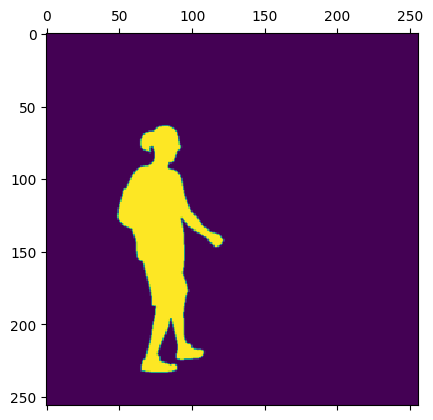

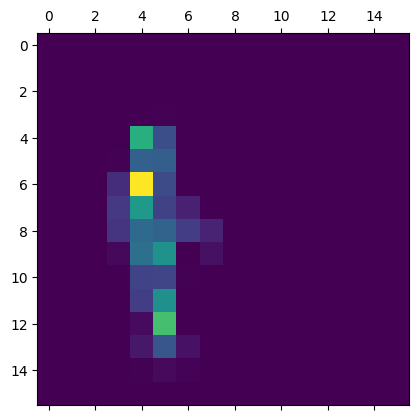

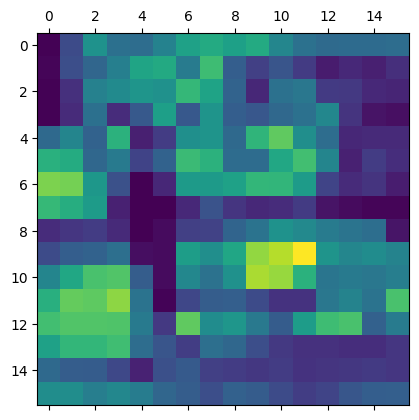

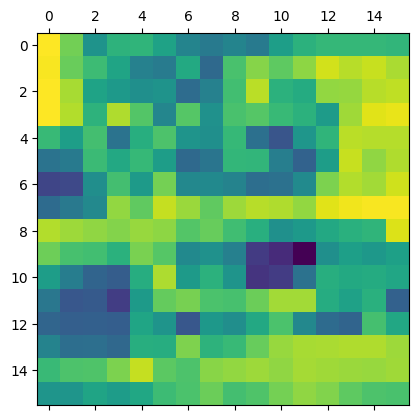

In [24]:
print(mask_img_list.shape)
temp = torch.sum(torch.squeeze(mask_img_list)[0], dim=0)
print(temp.shape)
print(temp.min(), temp.max())
plt.matshow(temp.detach().cpu().numpy())

print(soft_grid_mask_f.shape)
temp = torch.sum(torch.squeeze(soft_grid_mask_f), dim=0)
print(temp.shape)
print(temp.min(), temp.max())
plt.matshow(temp.detach().cpu().numpy())

print(soft_grid_mask_b.shape)
temp = torch.sum(torch.squeeze(soft_grid_mask_b), dim=0)
print(temp.shape)
print(temp.min(), temp.max())
plt.matshow(temp.detach().cpu().numpy())

print(blended_grid.shape)
temp = torch.sum(torch.squeeze(blended_grid), dim=0)
print(temp.shape)
print(temp.min(), temp.max())
plt.matshow(temp.detach().cpu().numpy())